In [18]:
# Importing necessary libraries
import numpy as np
import pandas as pd
from lightgbm import LGBMRegressor
import shap

from treemind.algorithm import Explainer

from examples.examples_plot import (
    plot_line_chart,
    plot_scatter_chart,
    interaction_scatter_plot,
    feature_plot,
)

In [19]:
n_samples = 60000

np.random.seed(42)  # Setting a random seed for reproducibility

# Base features with diverse probability distributions
feature_0 = np.random.gamma(shape=2, scale=2, size=n_samples)  # Gamma distribution
feature_1 = np.random.beta(2, 5, size=n_samples) * 10  # Beta distribution scaled
feature_2 = np.random.exponential(scale=1.5, size=n_samples)  # Exponential
feature_3 = np.random.chisquare(df=3, size=n_samples)  # Chi-square
feature_4 = np.random.weibull(1.5, size=n_samples)  # Weibull
feature_5 = np.random.normal(loc=2, scale=1.5, size=n_samples)  # Normal
feature_6 = np.random.uniform(low=-5, high=5, size=n_samples)  # Uniform
feature_7 = np.random.laplace(loc=0, scale=2, size=n_samples)  # Laplace
feature_8 = np.random.lognormal(mean=0, sigma=0.5, size=n_samples)  # Log-normal

# Complex non-linear transformations
transformed_0 = np.log1p(feature_0) * np.sqrt(feature_0)
transformed_1 = np.exp(-feature_1 / 5) * np.sin(feature_1)
transformed_2 = np.tanh(feature_2) * feature_2**1.5
transformed_3 = np.sqrt(np.abs(feature_3)) * np.cos(feature_3)
transformed_4 = np.sinh(feature_4) / (1 + feature_4**2)
transformed_5 = np.where(
    feature_5 > 0,
    feature_5 * np.sin(feature_5),  # Applies log1p only for positive values
    np.log1p(np.abs(feature_5)) * np.cos(feature_5),  # Takes abs for negative values
)
transformed_6 = np.sign(feature_6) * np.abs(feature_6) ** (2 / 3)
transformed_7 = np.exp(-np.abs(feature_7)) * np.cos(feature_7 * np.pi / 2)
transformed_8 = np.log(feature_8 + 1) * np.sin(feature_8)

# New pairwise interactions
interaction_0_2 = (
    transformed_0 * transformed_2 / (1 + np.abs(transformed_0 + transformed_2))
)
interaction_1_3 = np.maximum(transformed_1, transformed_3) - np.minimum(
    transformed_1, transformed_3
)
interaction_4_6 = np.sign(transformed_4 + transformed_6) * np.sqrt(
    np.abs(transformed_4 * transformed_6)
)
interaction_5_7 = np.log1p(np.abs(transformed_5 - transformed_7))
interaction_6_8 = np.exp(-np.abs(transformed_6)) * np.sin(transformed_8)

# Generated target with new interactions
target = target = (
    0.4 * transformed_0
    - 0.6 * transformed_1
    + 0.3 * transformed_2
    + 0.5 * transformed_3
    - 0.4 * transformed_4
    + 0.7 * transformed_5
    - 0.3 * transformed_6
    + 0.5 * transformed_7
    - 0.4 * transformed_8
    + 0.6 * interaction_0_2
    - 0.5 * interaction_1_3
    + 0.4 * interaction_4_6
    - 0.3 * interaction_5_7
    + 0.5 * interaction_6_8
    + np.random.normal(loc=0, scale=0.2, size=n_samples)  # Biraz daha noise ekledim
)

# Add some outliers
outlier_idx = np.random.choice(n_samples, size=int(n_samples * 0.01), replace=False)
target[outlier_idx] += np.random.normal(loc=0, scale=5, size=len(outlier_idx))

# Create DataFrame with all features
df = pd.DataFrame(
    {
        "feature_0": feature_0,
        "feature_1": feature_1,
        "feature_2": feature_2,
        "feature_3": feature_3,
        "feature_4": feature_4,
        "feature_5": feature_5,
        "feature_6": feature_6,
        "feature_7": feature_7,
        "feature_8": feature_8,
        "target": target,
    }
)

X = df.drop("target", axis=1).values
y = df["target"].values

In [20]:
# Train a LightGBM model
reg = LGBMRegressor(verbose=-1, n_estimators=500, num_leaves=75, learning_rate=0.02)
reg.fit(X, y)  #
pred = reg.predict(X)

# Use treemind's Explainer to analyze the trained model
explainer = Explainer()
explainer(reg)

# Use shap's TreeExplainer to analyze the trained model
shap_explainer = shap.TreeExplainer(reg)
shap_values = shap_explainer(X)
shap_interaction_values = shap_explainer.shap_interaction_values(X)

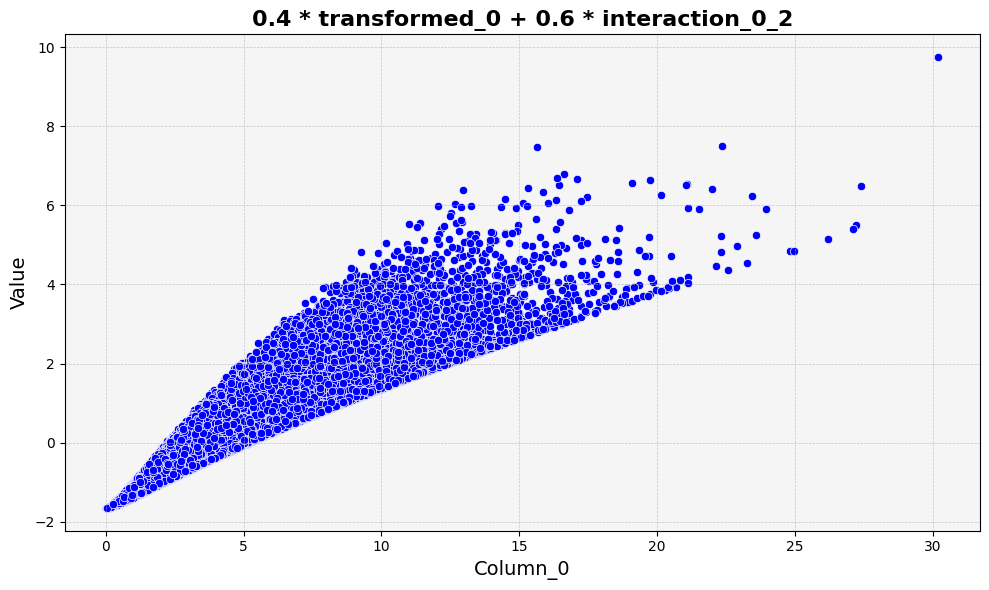

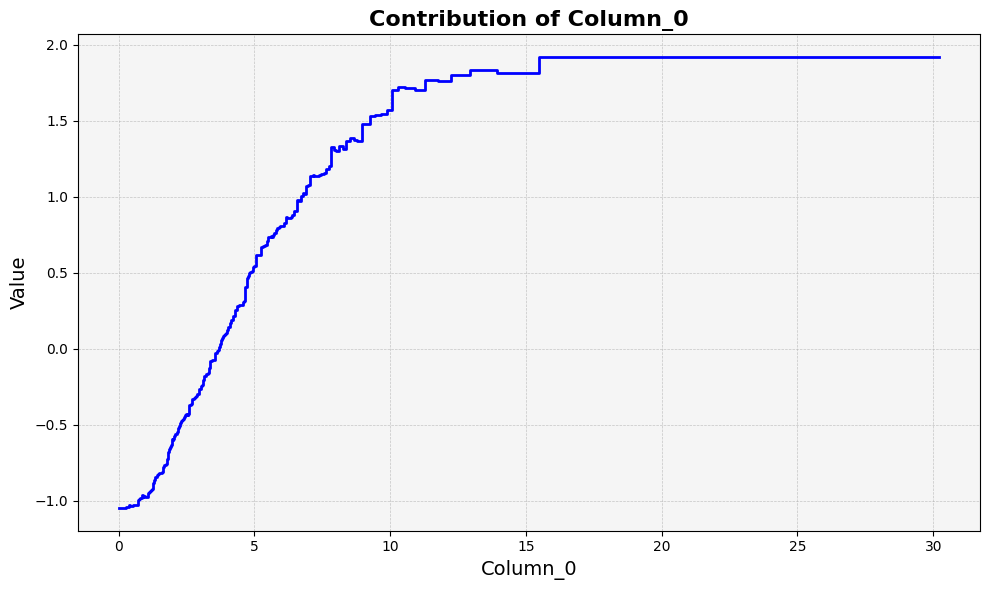

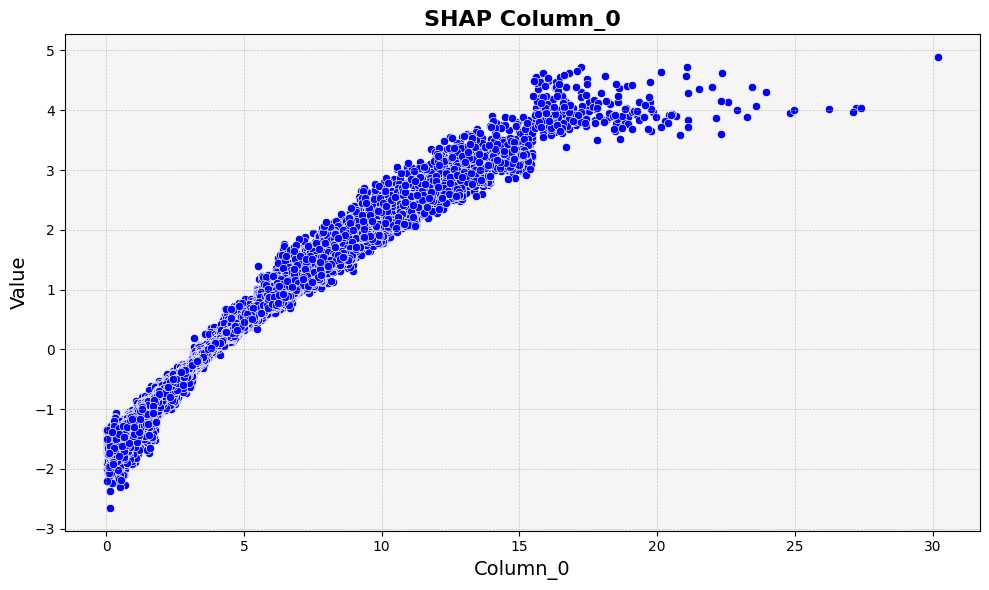

In [21]:
# Feature 0 Analysis
feature_df_0 = explainer.analyze_feature(0)
plot_line_chart(
    x=feature_0,
    y=0.4 * transformed_0
    + 0.6 * interaction_0_2
    - np.mean(0.4 * transformed_0 + 0.6 * interaction_0_2),
    x_label="Column_0",
    y_label="Value",
    title="0.4 * transformed_0 + 0.6 * interaction_0_2",
)
feature_plot(
    feature_df_0, show_min_max=False, col_min=X[:, 0].min(), col_max=X[:, 0].max()
)
plot_line_chart(
    x=feature_0,
    y=shap_values.values[:, 0],
    x_label="Column_0",
    y_label="Value",
    title="SHAP Column_0",
)

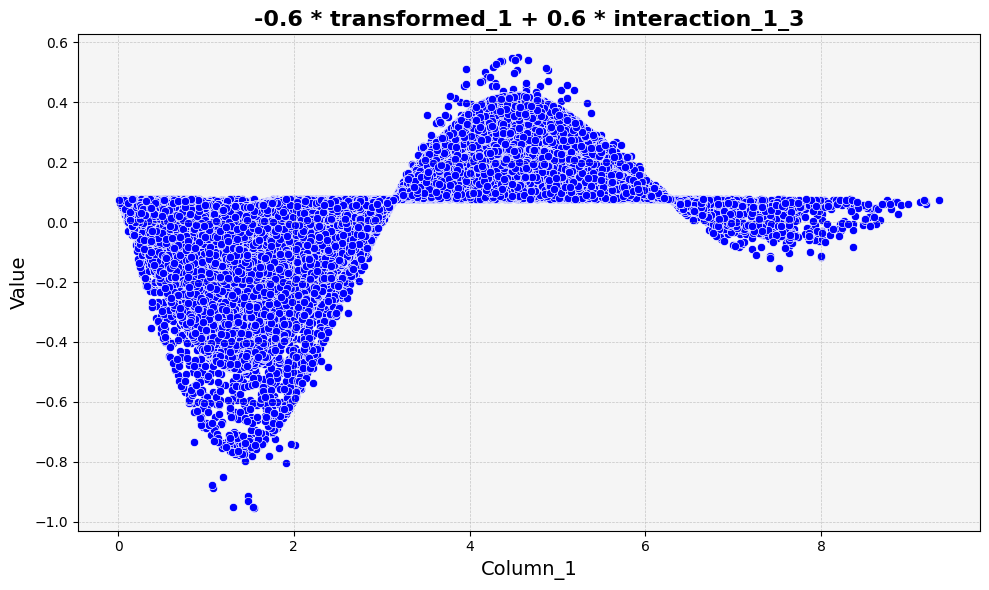

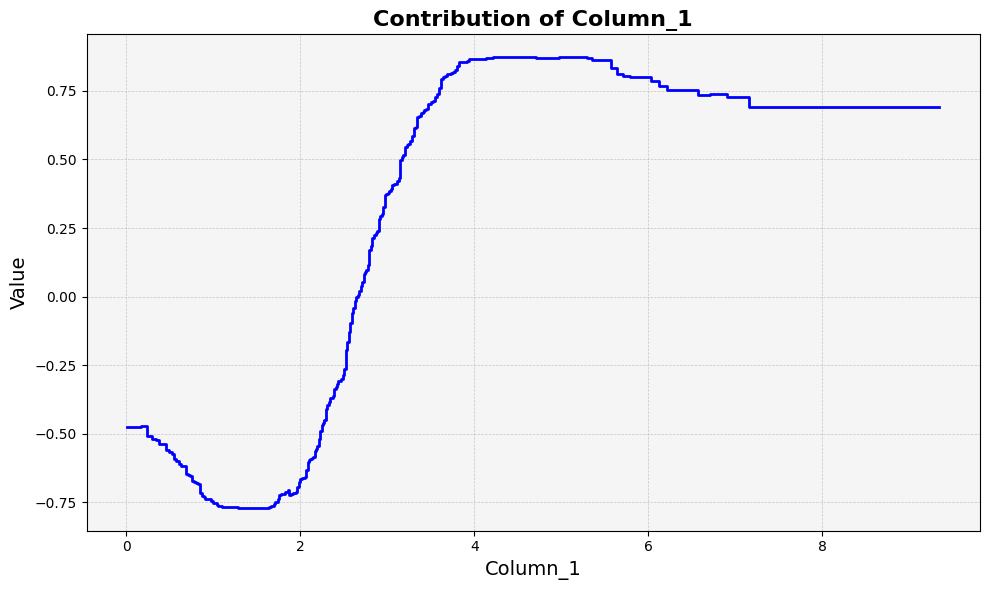

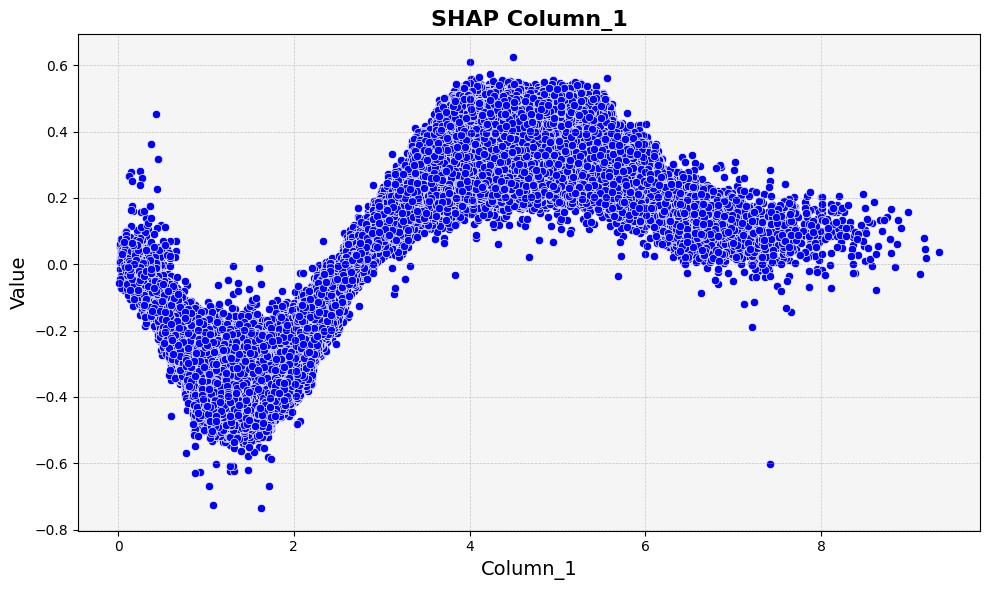

In [22]:
feature_df_1 = explainer.analyze_feature(1)
plot_line_chart(
    x=feature_1,
    y=-0.6 * transformed_1 * 0.5 * interaction_1_3
    - np.mean(-0.6 * transformed_1 * 0.5 * interaction_1_3),
    x_label="Column_1",
    y_label="Value",
    title="-0.6 * transformed_1 + 0.6 * interaction_1_3",
)
feature_plot(
    feature_df_1, show_min_max=False, col_min=X[:, 1].min(), col_max=X[:, 1].max()
)
plot_line_chart(
    x=feature_1,
    y=shap_values.values[:, 1],
    x_label="Column_1",
    y_label="Value",
    title="SHAP Column_1",
)

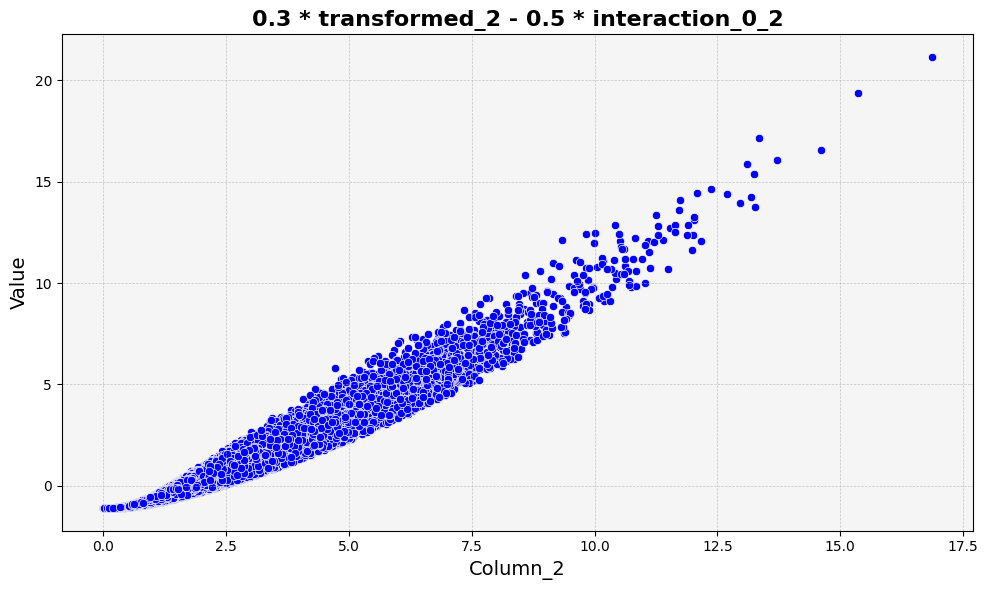

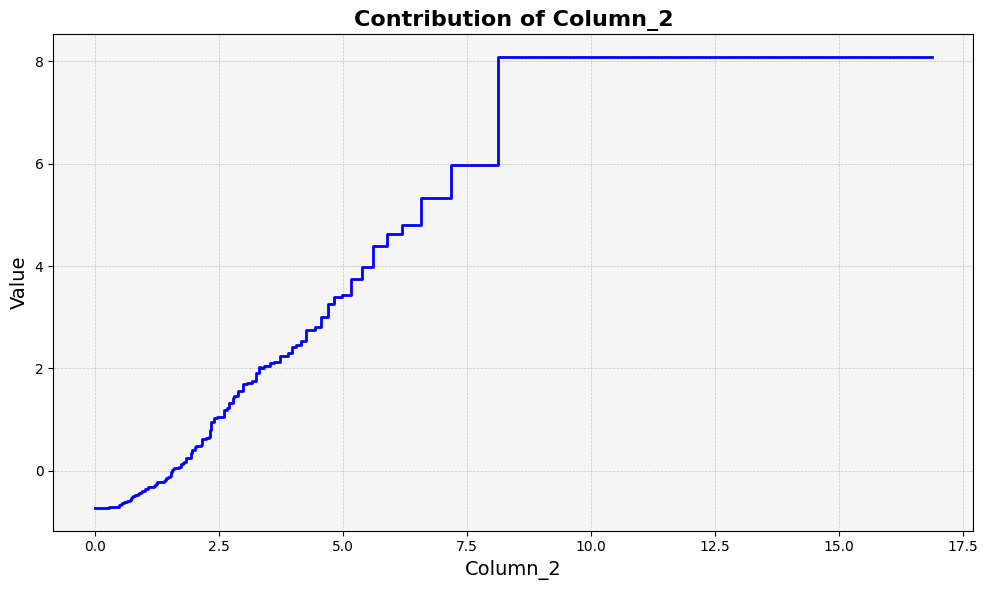

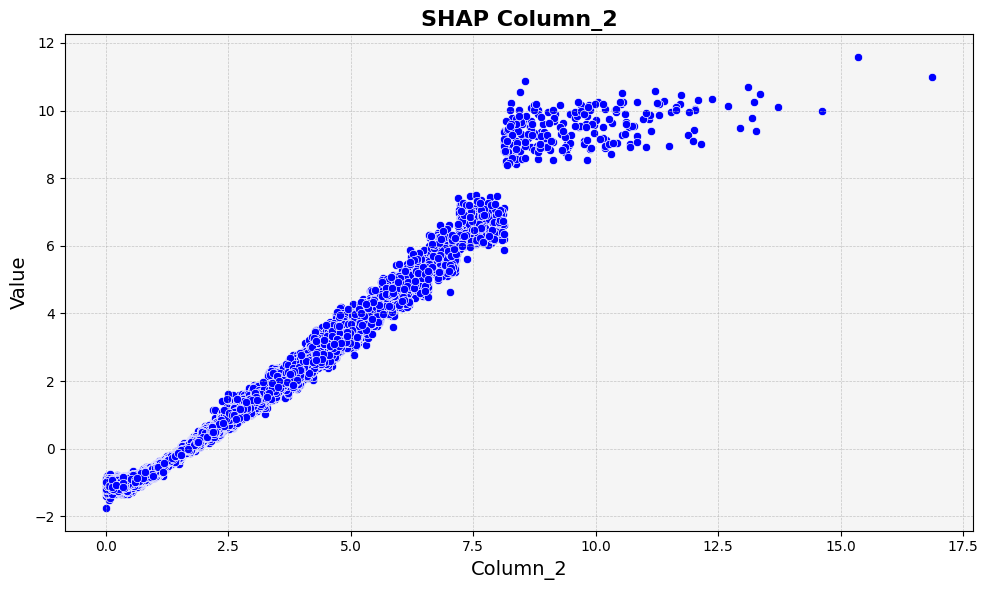

In [23]:
# Feature 2 Analysis
feature_df_2 = explainer.analyze_feature(2)
plot_line_chart(
    x=feature_2,
    y=0.3 * transformed_2
    + 0.6 * interaction_0_2
    - np.mean(0.3 * transformed_2 + 0.6 * interaction_0_2),
    x_label="Column_2",
    y_label="Value",
    title="0.3 * transformed_2 - 0.5 * interaction_0_2",
)
feature_plot(
    feature_df_2, show_min_max=False, col_min=X[:, 2].min(), col_max=X[:, 2].max()
)
plot_line_chart(
    x=feature_2,
    y=shap_values.values[:, 2],
    x_label="Column_2",
    y_label="Value",
    title="SHAP Column_2",
)

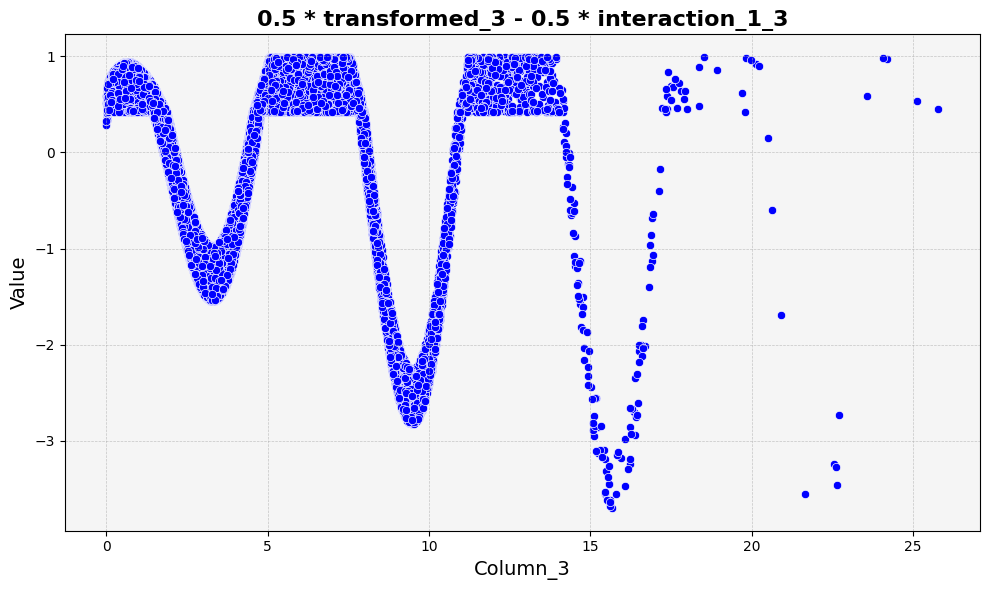

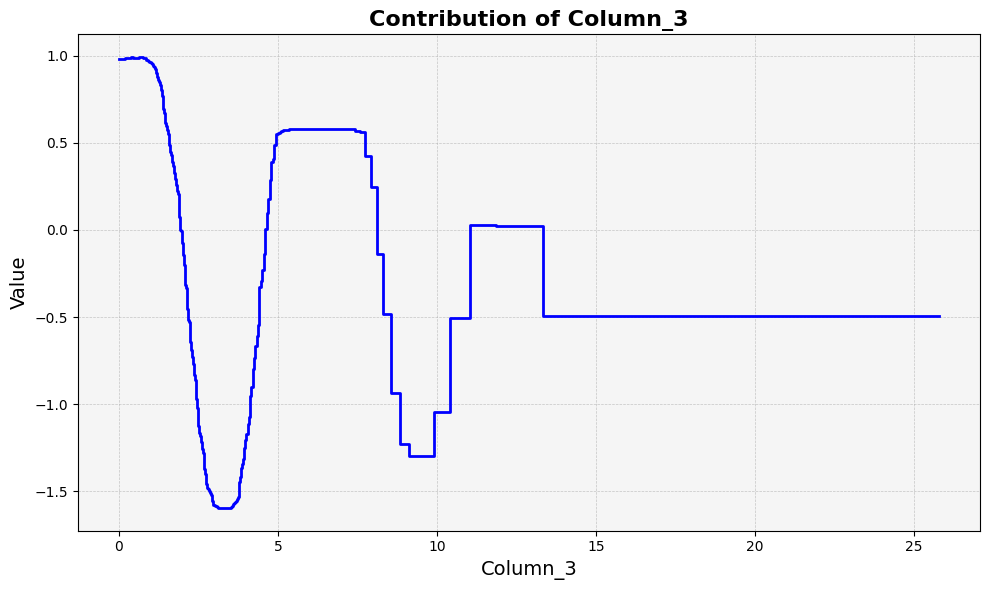

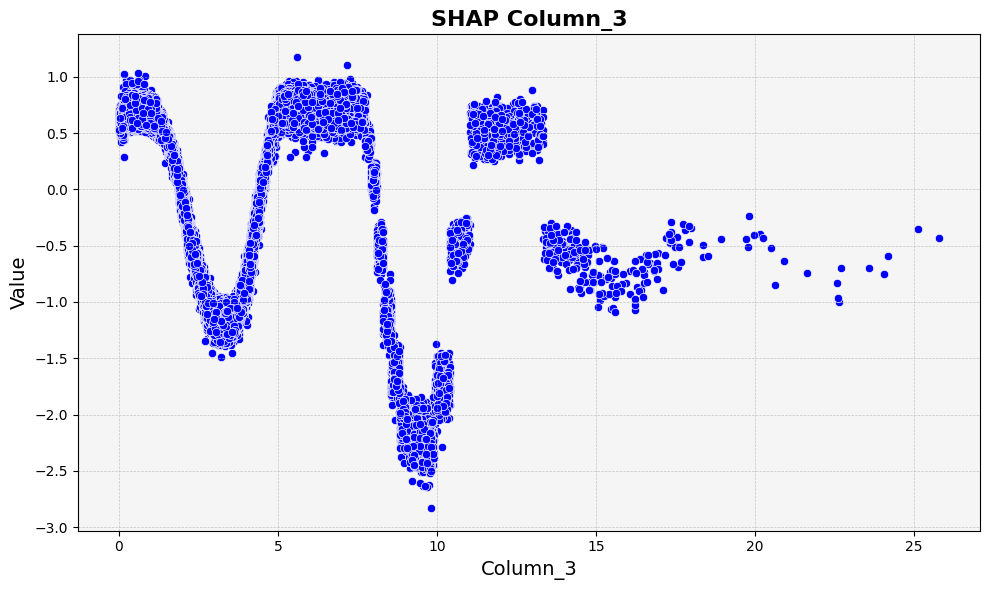

In [24]:
# Feature 3 Analysis
feature_df_3 = explainer.analyze_feature(3)
plot_line_chart(
    x=feature_3,
    y=0.5 * transformed_3
    - 0.5 * interaction_1_3
    - np.mean(0.5 * transformed_3 - 0.5 * interaction_1_3),
    x_label="Column_3",
    y_label="Value",
    title="0.5 * transformed_3 - 0.5 * interaction_1_3",
)
feature_plot(
    feature_df_3, show_min_max=False, col_min=X[:, 3].min(), col_max=X[:, 3].max()
)
plot_line_chart(
    x=feature_3,
    y=shap_values.values[:, 3],
    x_label="Column_3",
    y_label="Value",
    title="SHAP Column_3",
)

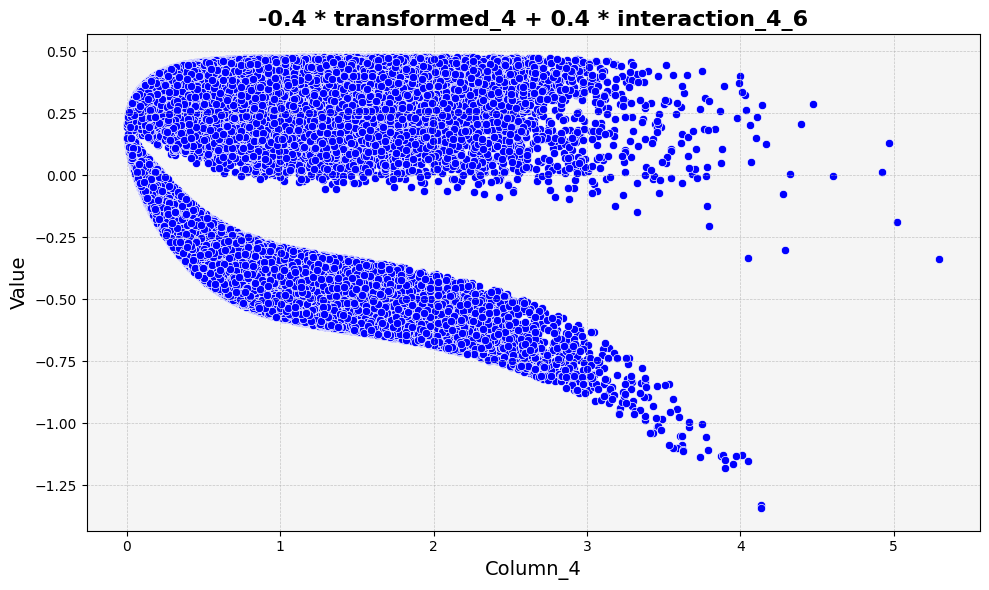

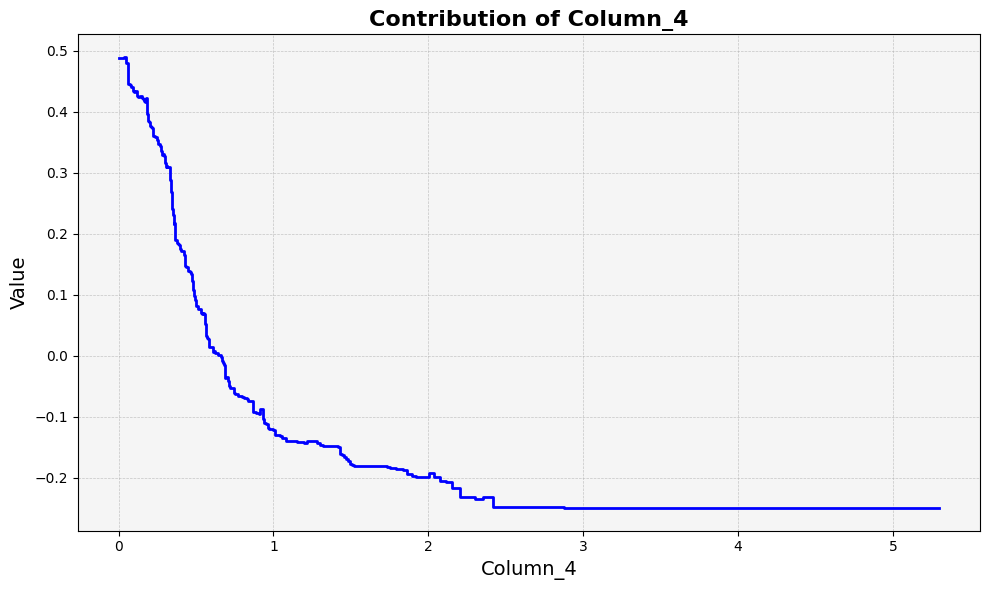

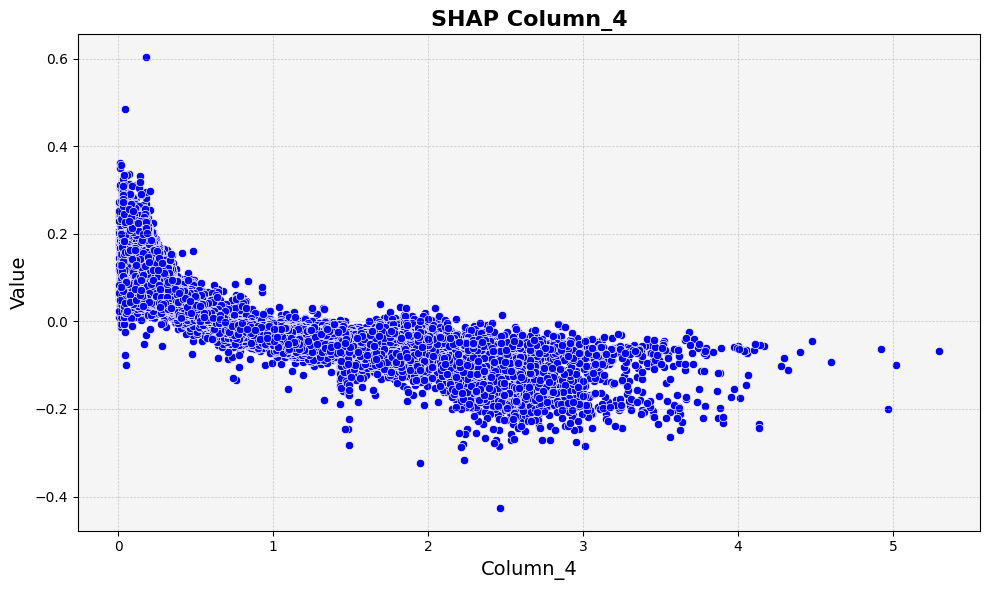

In [25]:
# Feature 4 Analysis
feature_df_4 = explainer.analyze_feature(4)
plot_line_chart(
    x=feature_4,
    y=-0.4 * transformed_4
    + 0.4 * interaction_4_6
    - np.mean(-0.4 * transformed_4 + 0.4 * interaction_4_6),
    x_label="Column_4",
    y_label="Value",
    title="-0.4 * transformed_4 + 0.4 * interaction_4_6",
)
feature_plot(
    feature_df_4, show_min_max=False, col_min=X[:, 4].min(), col_max=X[:, 4].max()
)
plot_line_chart(
    x=feature_4,
    y=shap_values.values[:, 4],
    x_label="Column_4",
    y_label="Value",
    title="SHAP Column_4",
)

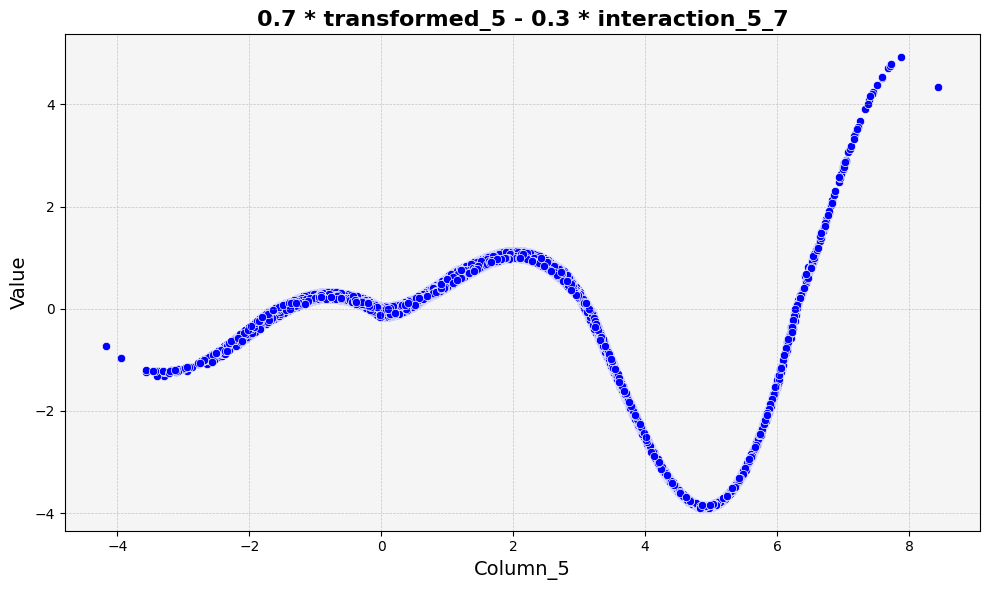

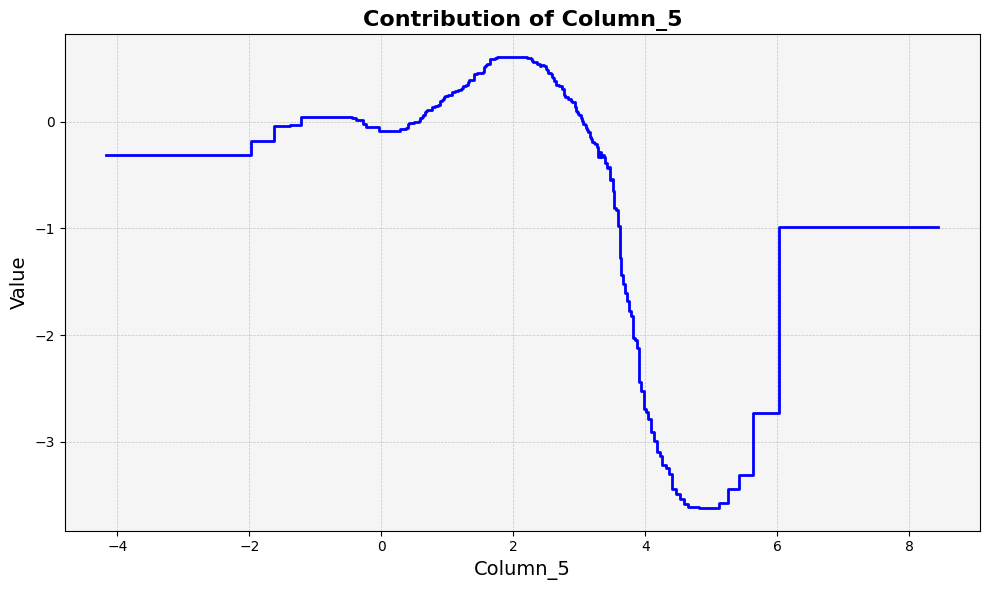

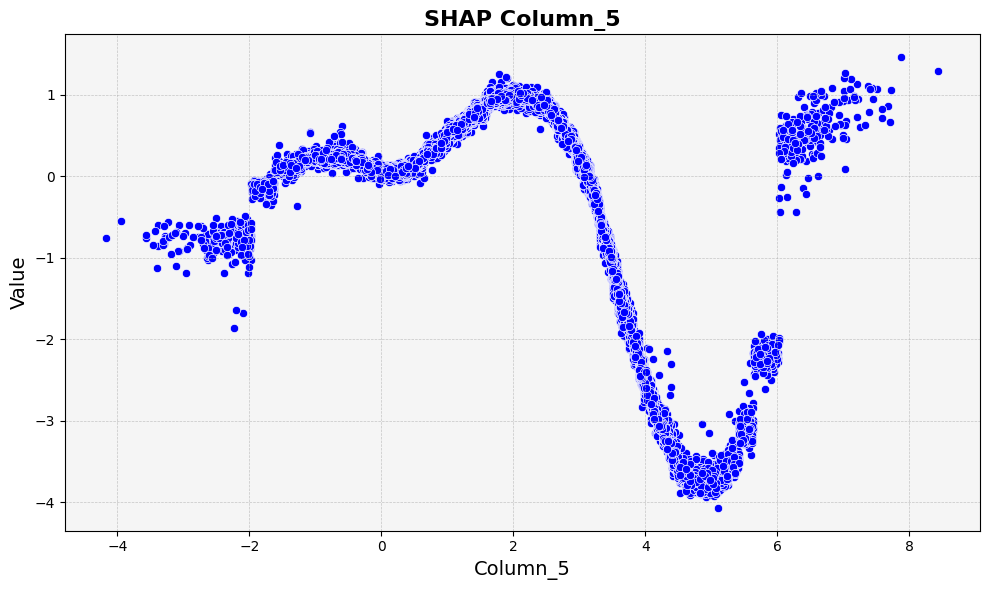

In [26]:
# Feature 5 Analysis
feature_df_5 = explainer.analyze_feature(5)
plot_line_chart(
    x=feature_5,
    y=0.7 * transformed_5
    - 0.3 * interaction_5_7
    - np.mean(0.7 * transformed_5 - 0.3 * interaction_5_7),
    x_label="Column_5",
    y_label="Value",
    title="0.7 * transformed_5 - 0.3 * interaction_5_7",
)
feature_plot(
    feature_df_5, show_min_max=False, col_min=X[:, 5].min(), col_max=X[:, 5].max()
)
plot_line_chart(
    x=feature_5,
    y=shap_values.values[:, 5],
    x_label="Column_5",
    y_label="Value",
    title="SHAP Column_5",
)

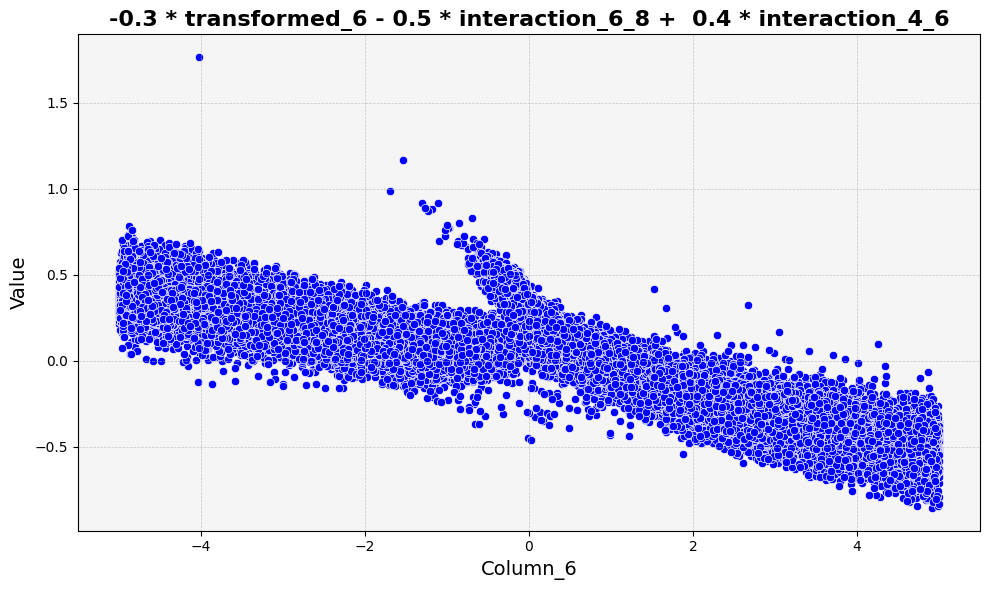

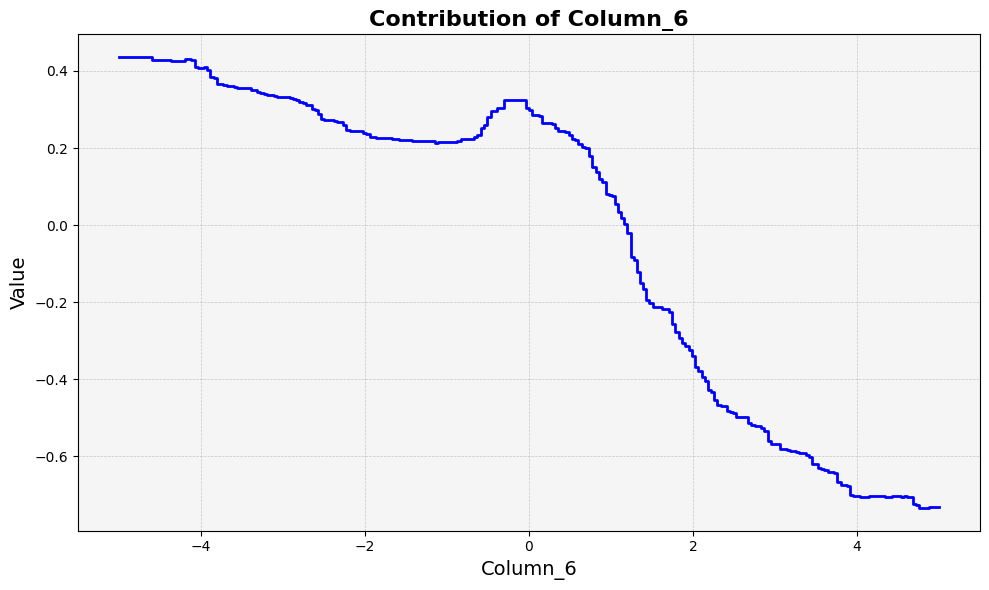

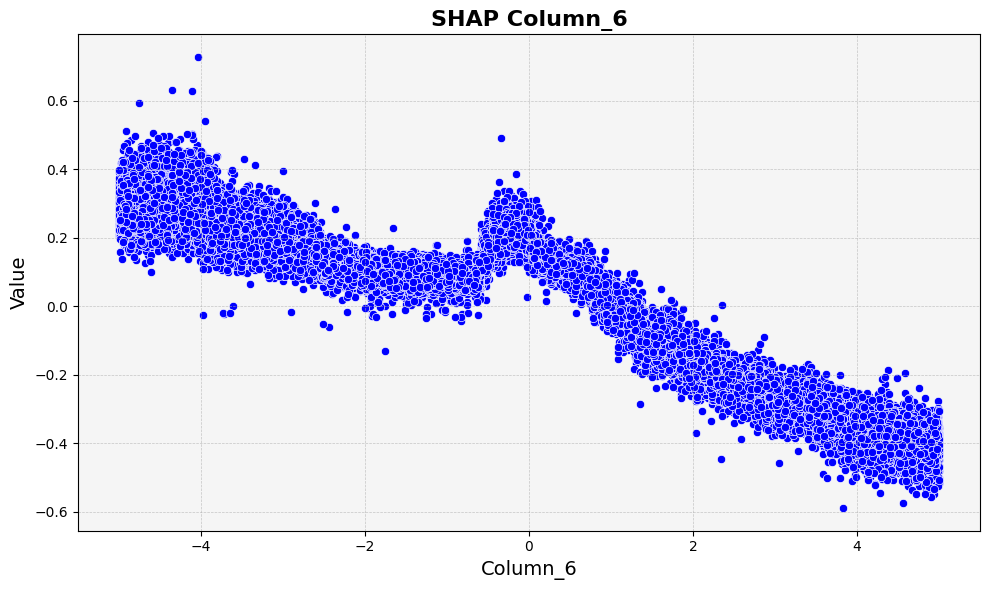

In [27]:
# Feature 6 Analysis
feature_df_6 = explainer.analyze_feature(6)
plot_line_chart(
    x=feature_6,
    y=-0.3 * transformed_6
    + 0.5 * interaction_6_8
    + 0.4 * interaction_4_6
    - np.mean(-0.3 * transformed_6 + 0.5 * interaction_6_8 + 0.4 * interaction_4_6),
    x_label="Column_6",
    y_label="Value",
    title="-0.3 * transformed_6 - 0.5 * interaction_6_8 +  0.4 * interaction_4_6",
)
feature_plot(
    feature_df_6, show_min_max=False, col_min=X[:, 6].min(), col_max=X[:, 6].max()
)
plot_line_chart(
    x=feature_6,
    y=shap_values.values[:, 6],
    x_label="Column_6",
    y_label="Value",
    title="SHAP Column_6",
)

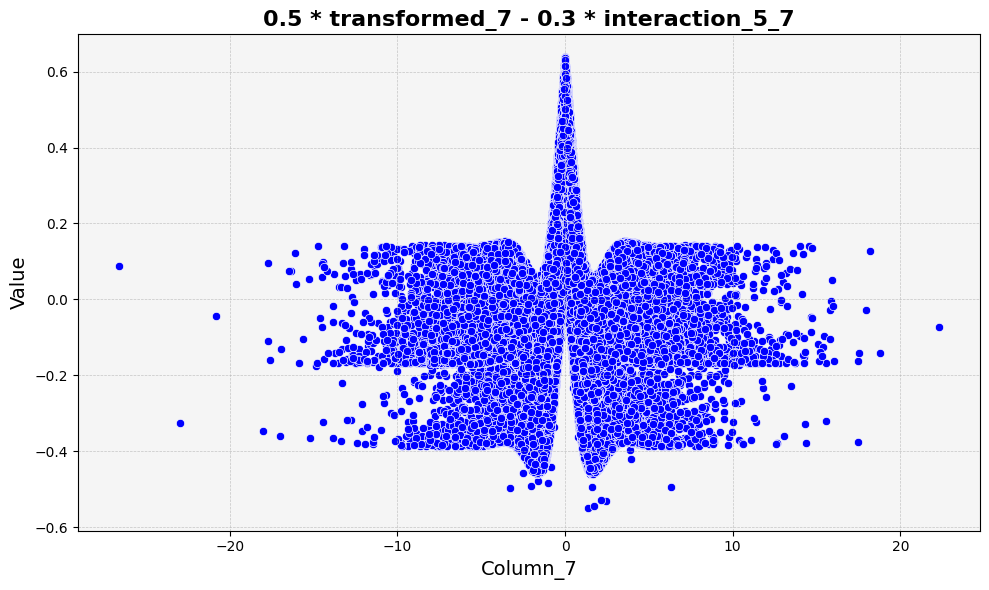

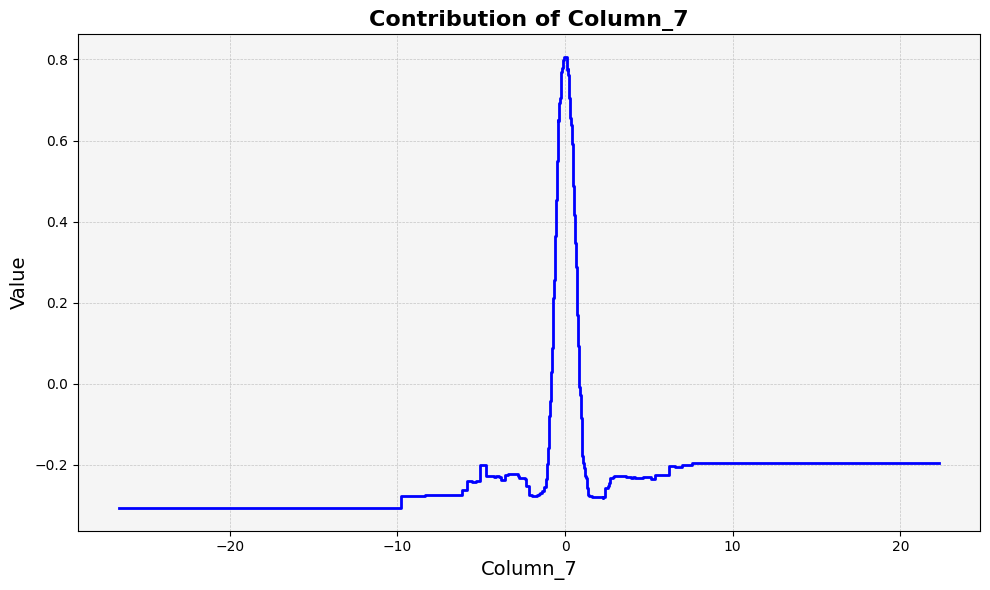

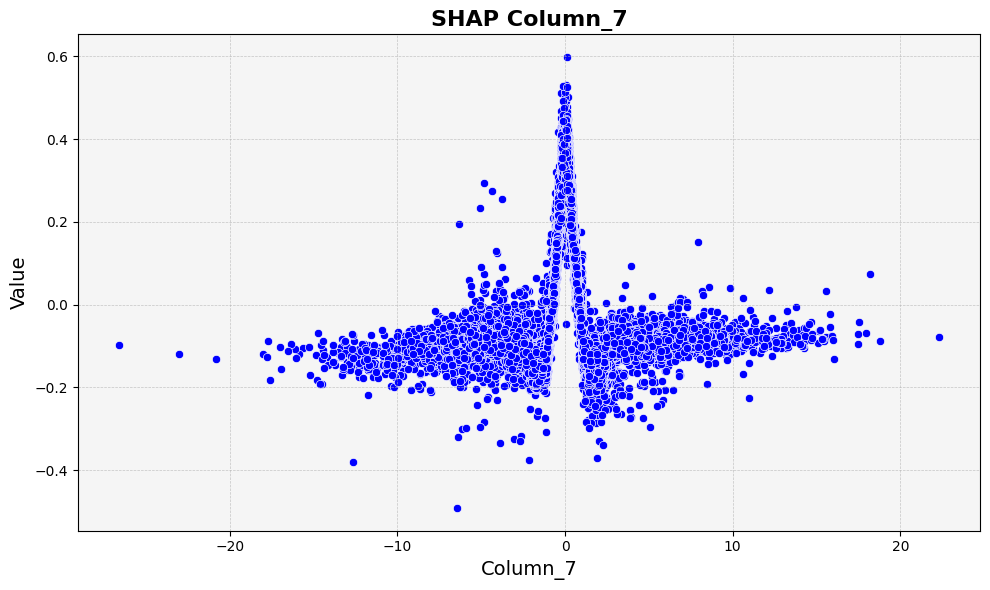

In [28]:
# Feature 7 Analysis
feature_df_7 = explainer.analyze_feature(7)
plot_line_chart(
    x=feature_7,
    y=0.5 * transformed_7
    - 0.3 * interaction_5_7
    - np.mean(0.5 * transformed_7 - 0.3 * interaction_5_7),
    x_label="Column_7",
    y_label="Value",
    title="0.5 * transformed_7 - 0.3 * interaction_5_7",
)
feature_plot(
    feature_df_7, show_min_max=False, col_min=X[:, 7].min(), col_max=X[:, 7].max()
)
plot_line_chart(
    x=feature_7,
    y=shap_values.values[:, 7],
    x_label="Column_7",
    y_label="Value",
    title="SHAP Column_7",
)

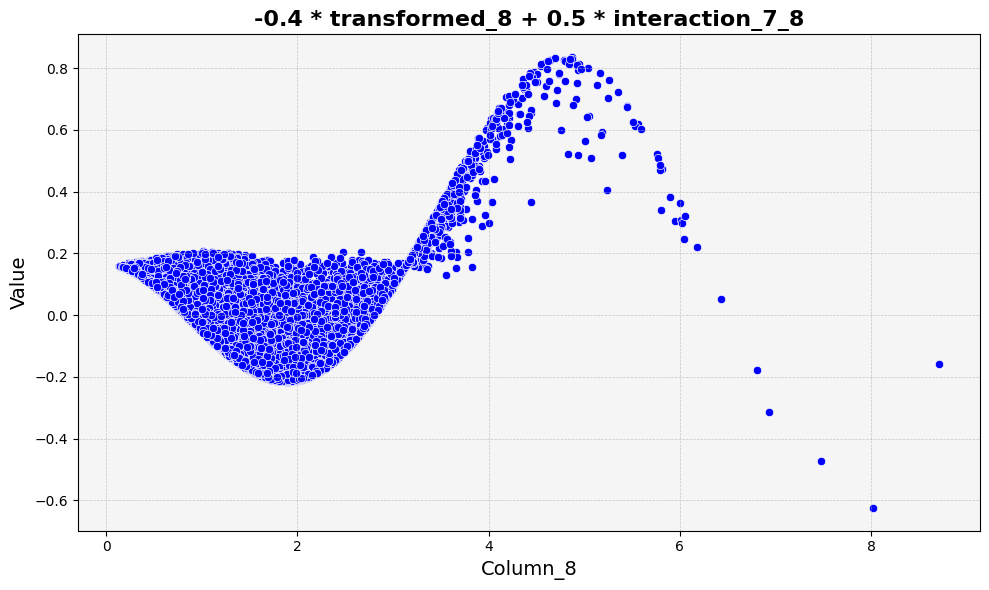

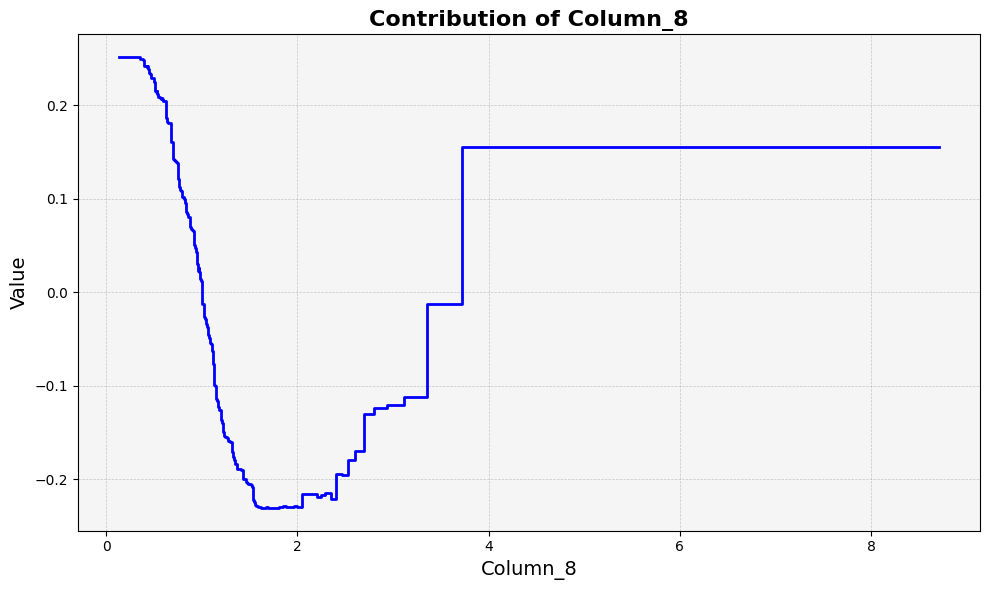

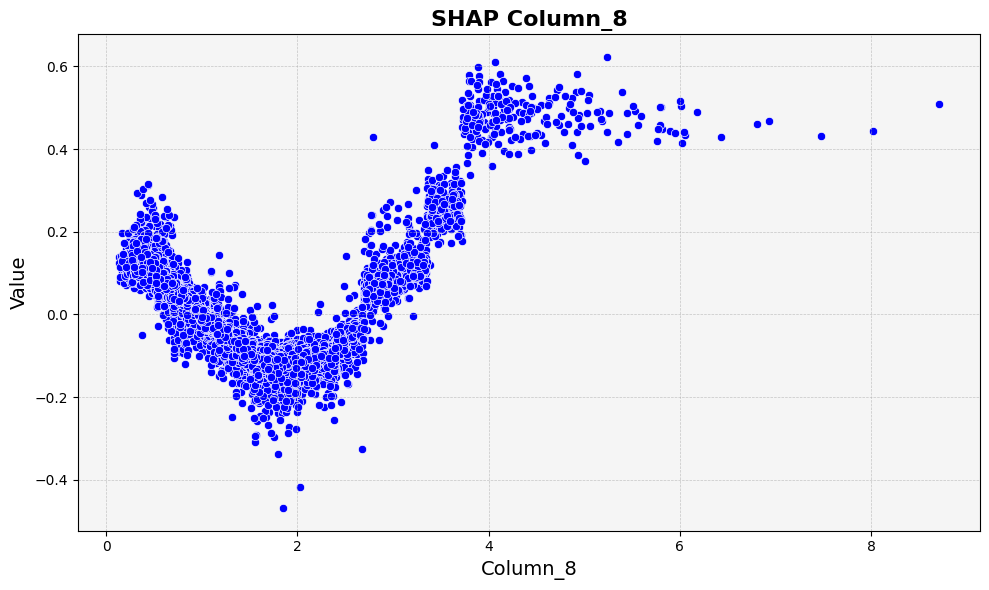

In [29]:
# Feature 8 Analysis
feature_df_8 = explainer.analyze_feature(8)
plot_line_chart(
    x=feature_8,
    y=-0.4 * transformed_8
    + 0.5 * interaction_6_8
    - np.mean(-0.4 * transformed_8 + 0.5 * interaction_6_8),
    x_label="Column_8",
    y_label="Value",
    title="-0.4 * transformed_8 + 0.5 * interaction_7_8",
)
feature_plot(
    feature_df_8, show_min_max=False, col_min=X[:, 8].min(), col_max=X[:, 8].max()
)
plot_line_chart(
    x=feature_8,
    y=shap_values.values[:, 8],
    x_label="Column_8",
    y_label="Value",
    title="SHAP Column_8",
)

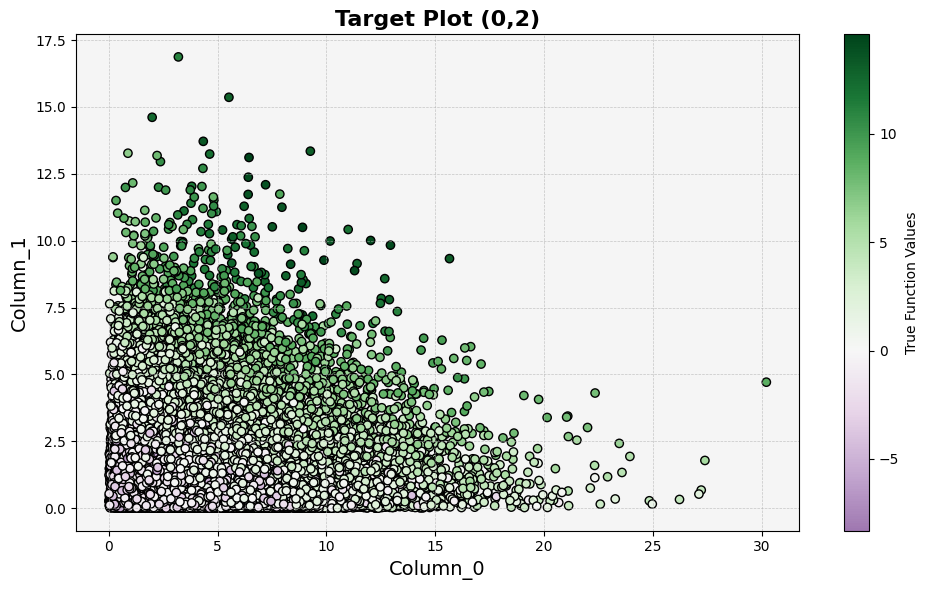

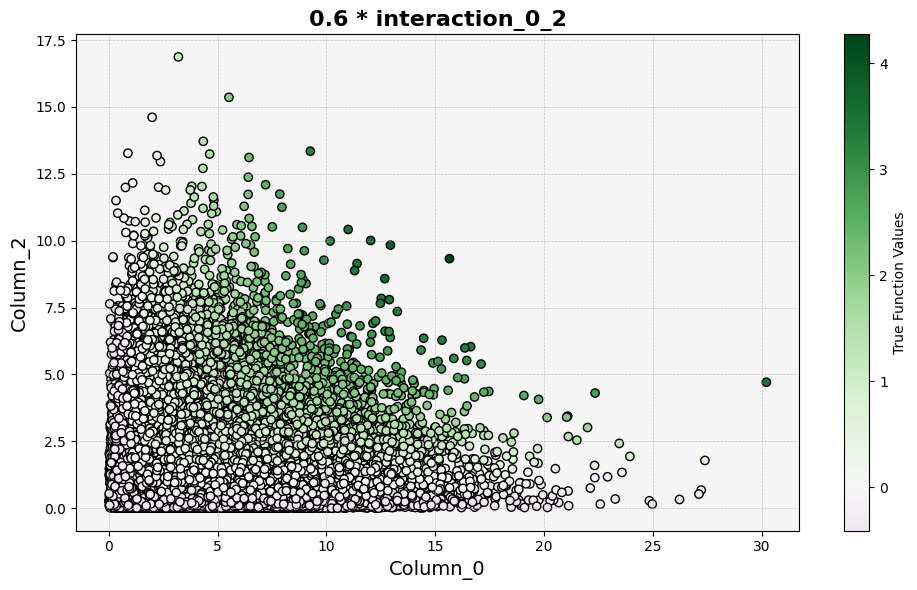

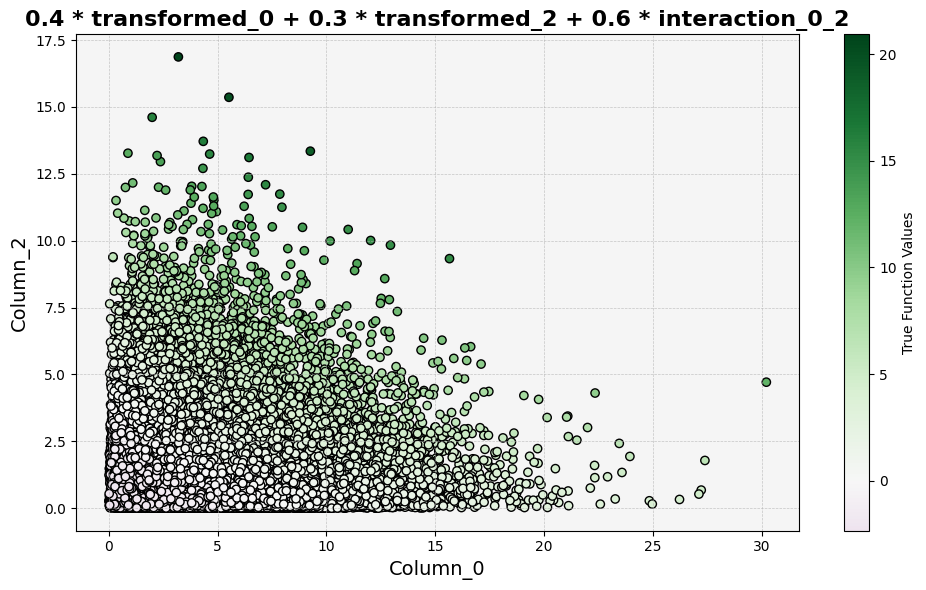

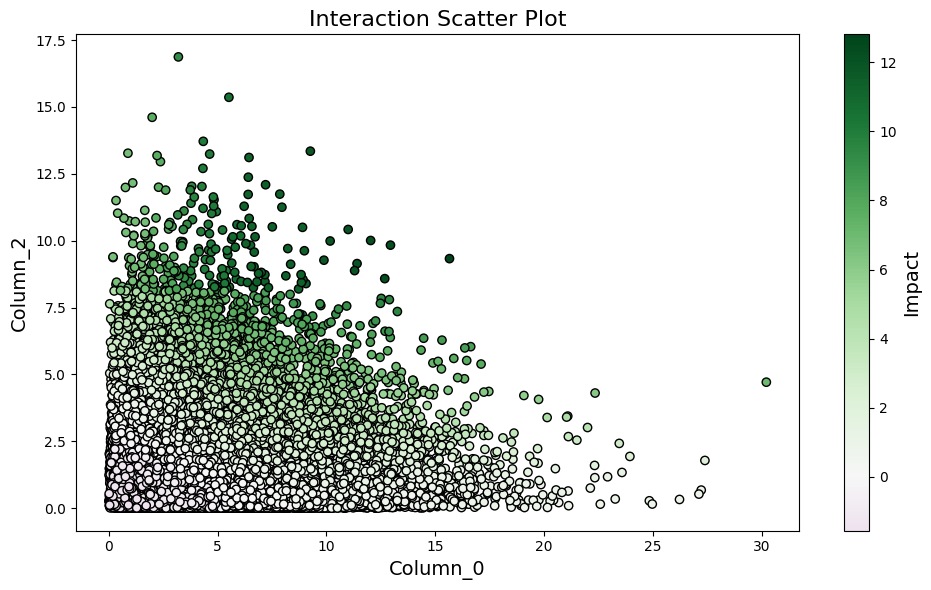

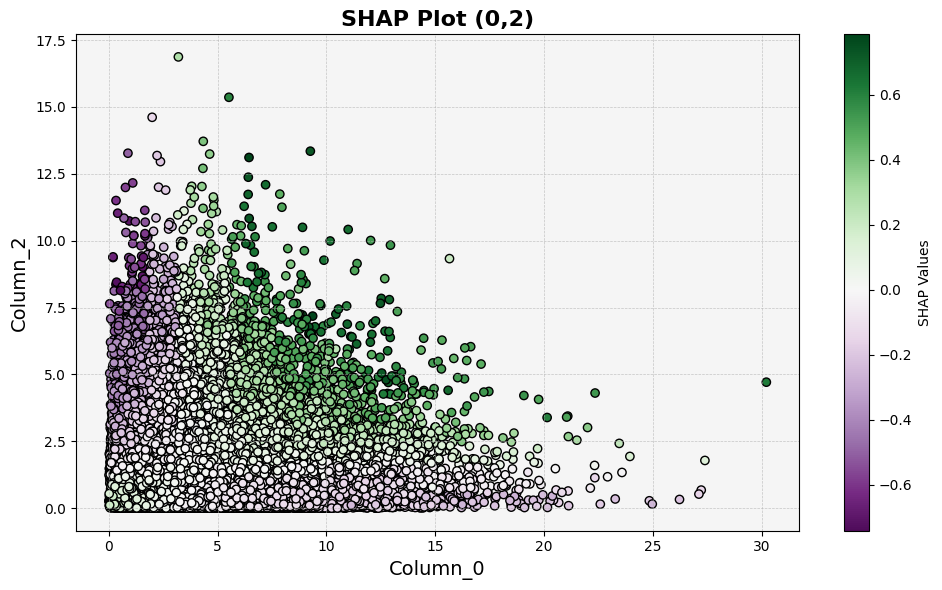

In [30]:
# Interaction Analysis: Feature 0 & Feature 1
df_01 = explainer.analyze_interaction(0, 2)

plot_scatter_chart(
    feature_0,
    feature_2,
    pred  - np.mean(pred),
    x_label="Column_0",
    y_label="Column_1",
    title="Target Plot (0,2)",
    cbar_label="True Function Values",
)


plot_scatter_chart(
    feature_0,
    feature_2,
    0.6 * interaction_0_2 - np.mean(0.6 * interaction_0_2),
    x_label="Column_0",
    y_label="Column_2",
    title="0.6 * interaction_0_2",
    cbar_label="True Function Values",
)


plot_scatter_chart(
    feature_0,
    feature_2,
    0.4 * transformed_0
    + 0.3 * transformed_2
    + 0.6 * interaction_0_2
    - np.mean(0.4 * transformed_0 + 0.3 * transformed_2 + 0.6 * interaction_0_2),
    x_label="Column_0",
    y_label="Column_2",
    title="0.4 * transformed_0 + 0.3 * transformed_2 + 0.6 * interaction_0_2",
    cbar_label="True Function Values",
)

interaction_scatter_plot(X, df_01, 0, 2, figsize=(10, 6))

plot_scatter_chart(
    feature_0,
    feature_2,
    shap_interaction_values[:, 0, 2],
    x_label="Column_0",
    y_label="Column_2",
    title="SHAP Plot (0,2)",
    cbar_label="SHAP Values",
)

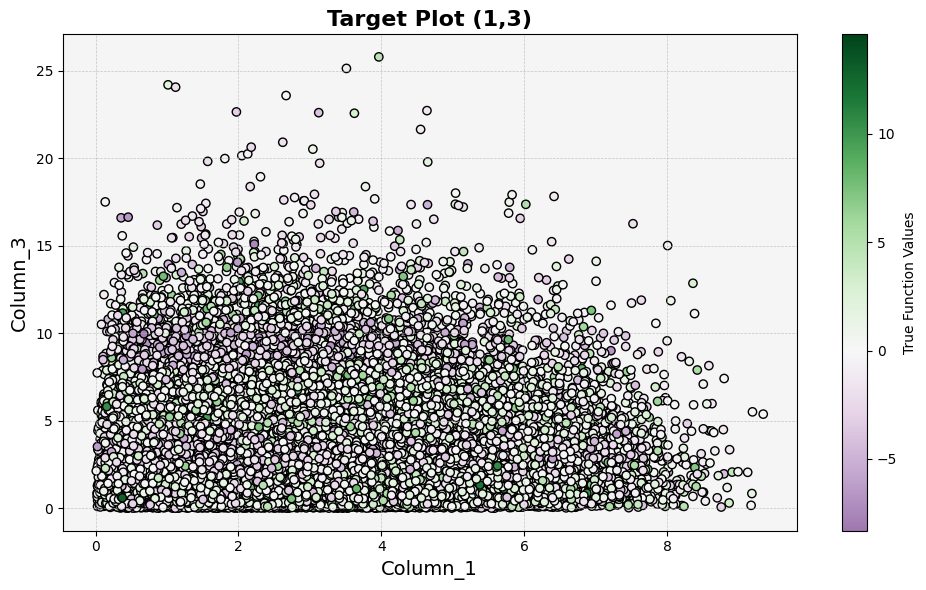

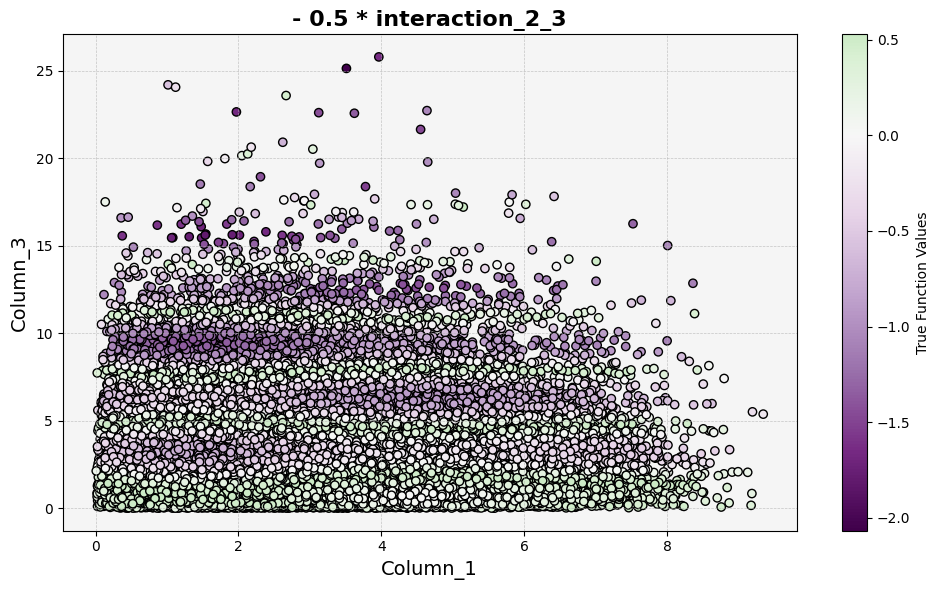

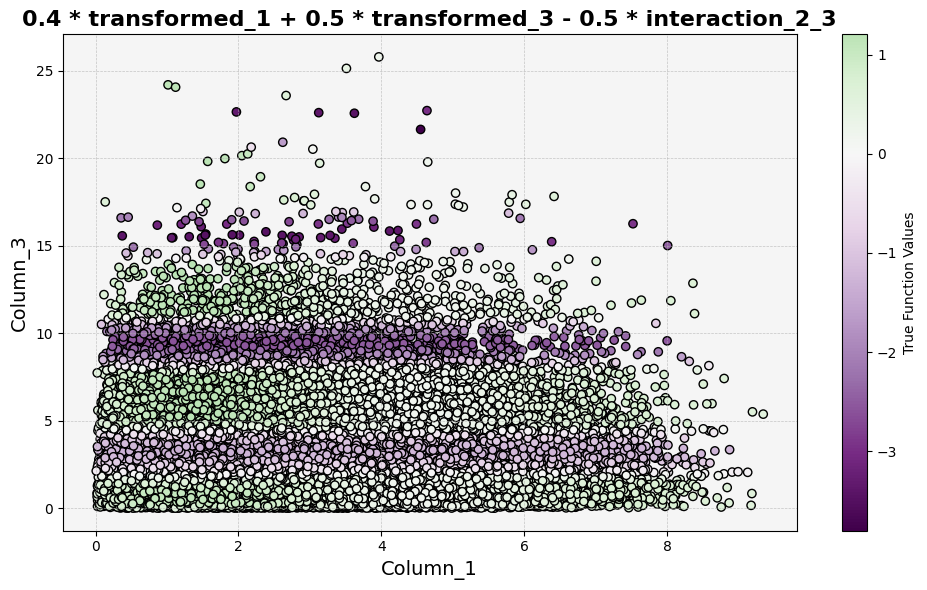

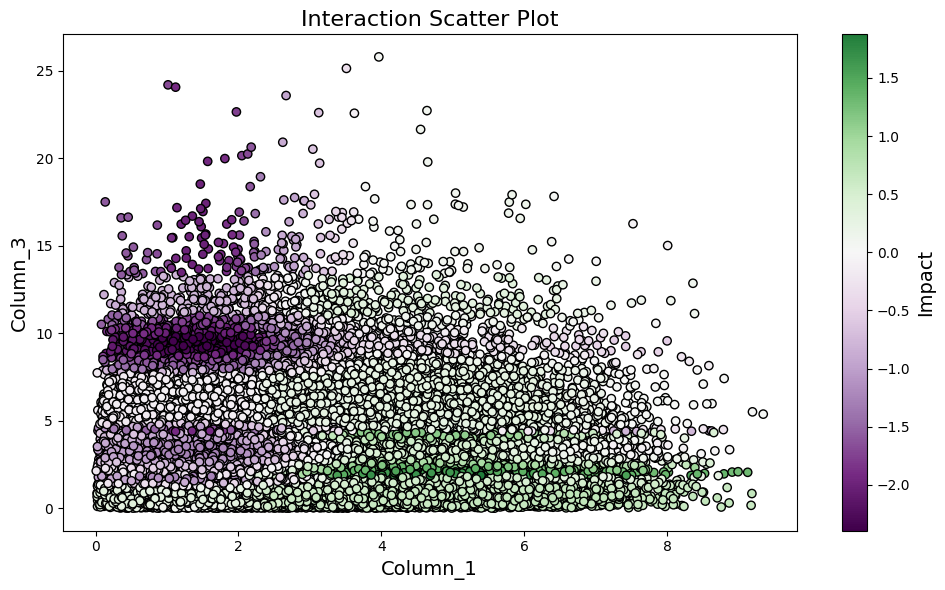

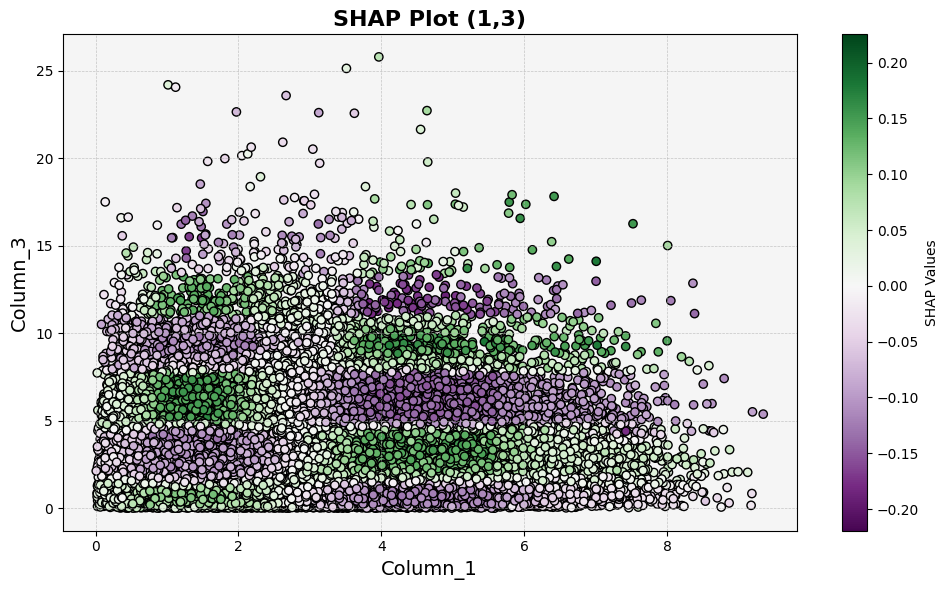

In [31]:
# Interaction Analysis: Feature 2 & Feature 3
df_23 = explainer.analyze_interaction(1, 3)

plot_scatter_chart(
    feature_1,
    feature_3,
    pred - np.mean(pred),
    x_label="Column_1",
    y_label="Column_3",
    title="Target Plot (1,3)",
    cbar_label="True Function Values",
)

plot_scatter_chart(
    feature_1,
    feature_3,
    -0.5 * interaction_1_3 - np.mean(-0.5 * interaction_1_3),
    x_label="Column_1",
    y_label="Column_3",
    title="- 0.5 * interaction_2_3",
    cbar_label="True Function Values",
)
plot_scatter_chart(
    feature_1,
    feature_3,
    0.4 * transformed_1
    + 0.5 * transformed_3
    - 0.5 * interaction_1_3
    - np.mean(0.4 * transformed_1 + 0.5 * transformed_3 - 0.5 * interaction_1_3),
    x_label="Column_1",
    y_label="Column_3",
    title="0.4 * transformed_1 + 0.5 * transformed_3 - 0.5 * interaction_2_3",
    cbar_label="True Function Values",
)
interaction_scatter_plot(X, df_23, 1, 3, figsize=(10, 6))

plot_scatter_chart(
    feature_1,
    feature_3,
    shap_interaction_values[:, 1, 3],
    x_label="Column_1",
    y_label="Column_3",
    title="SHAP Plot (1,3)",
    cbar_label="SHAP Values",
)

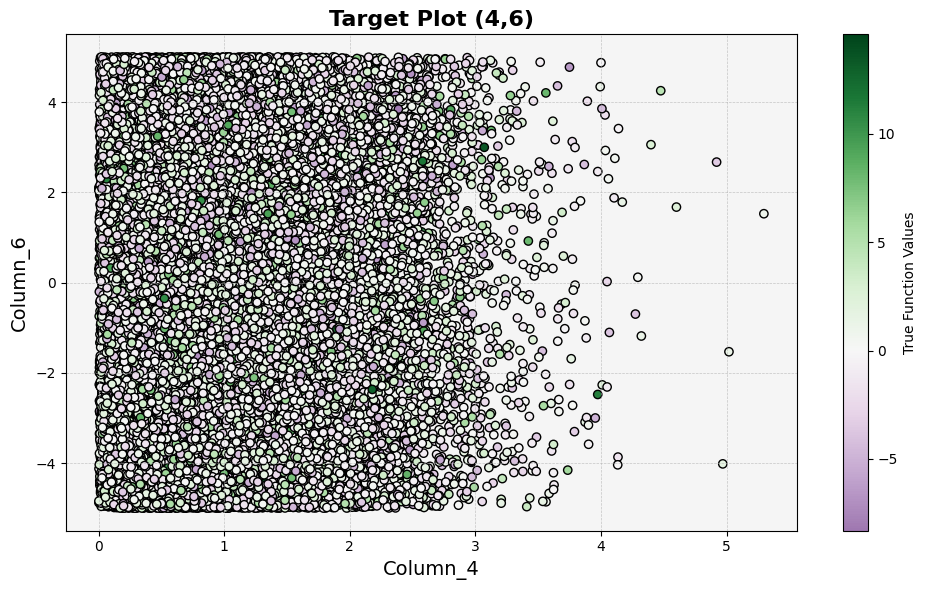

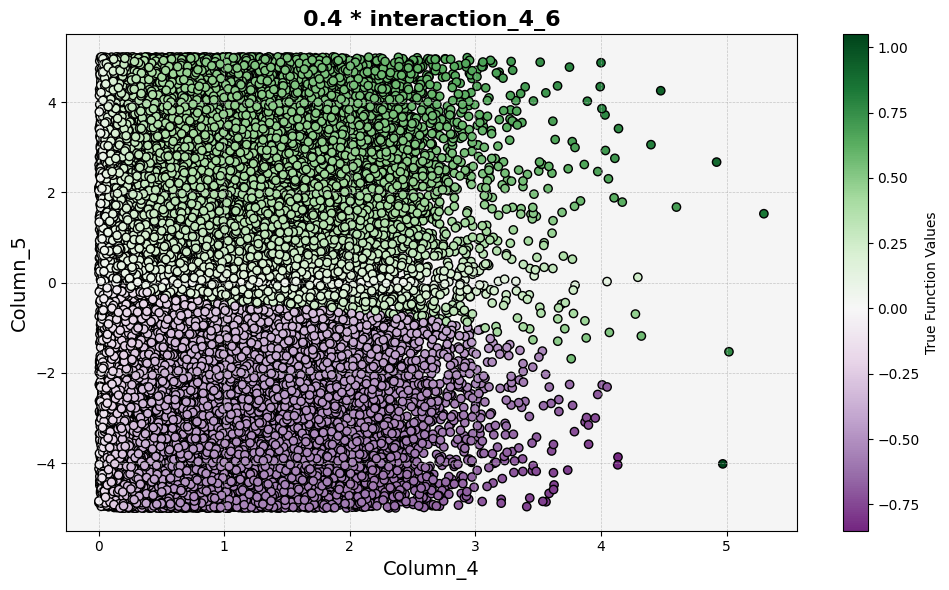

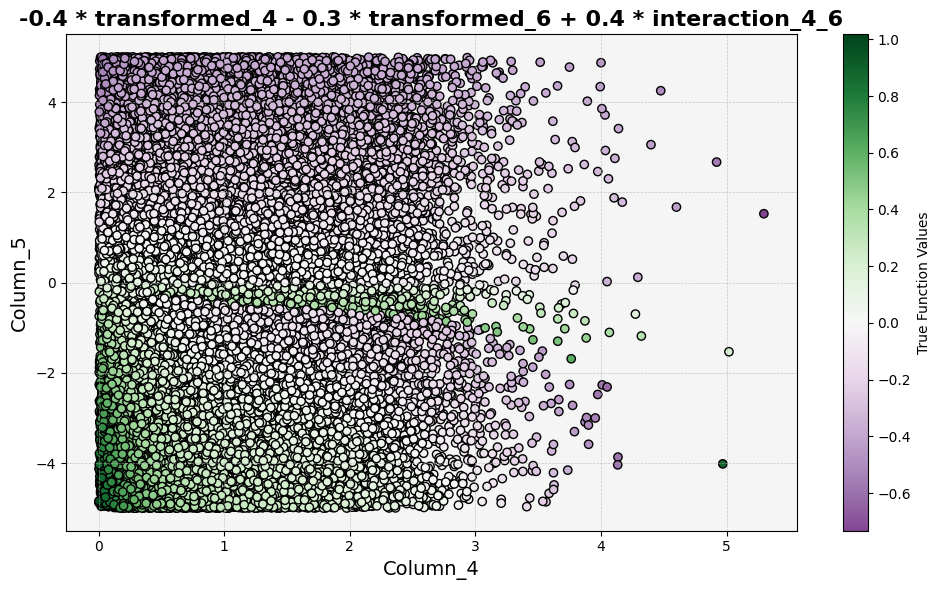

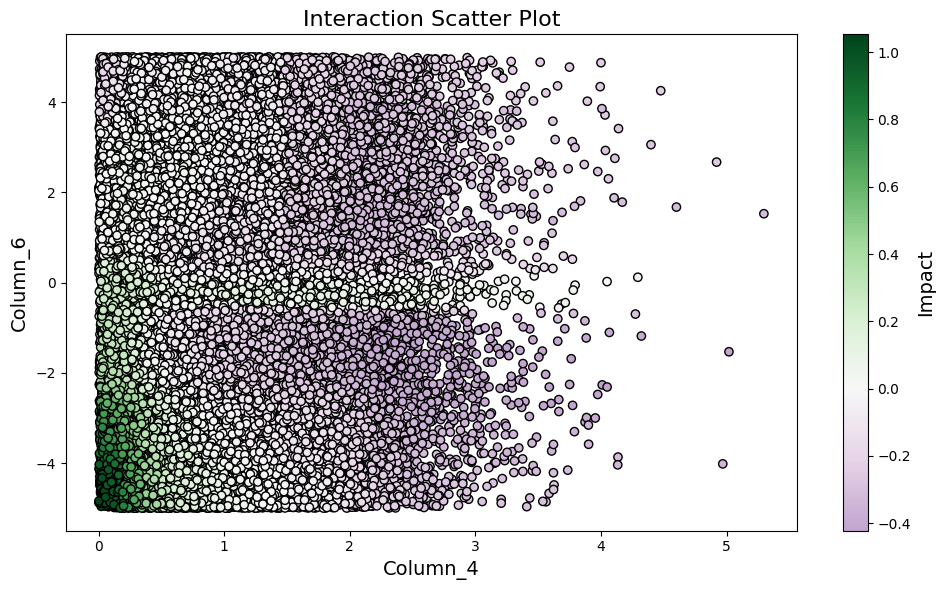

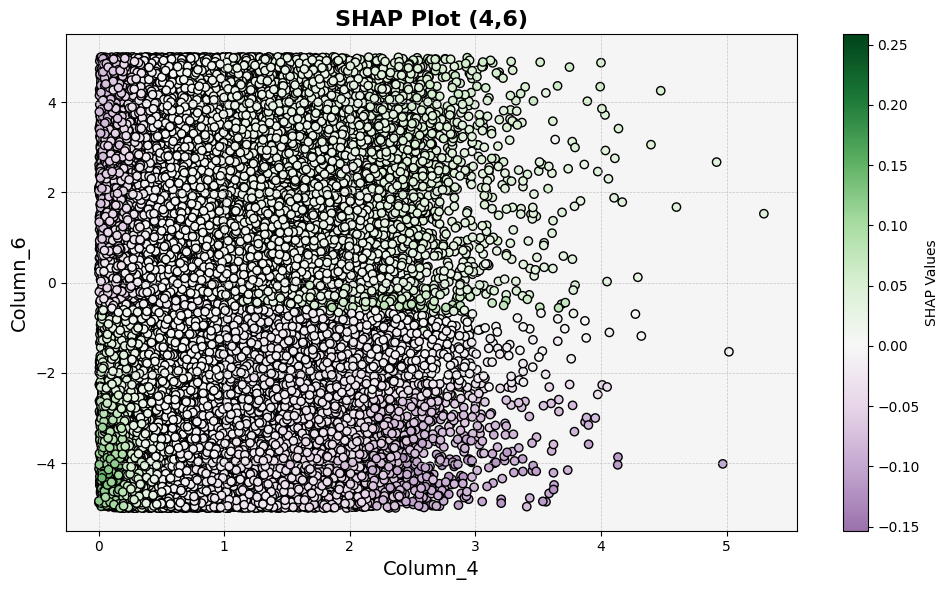

In [32]:
# Interaction Analysis: Feature 4 & Feature 5
df_45 = explainer.analyze_interaction(4, 6)

plot_scatter_chart(
    feature_4,
    feature_6,
    pred - np.mean(pred),
    x_label="Column_4",
    y_label="Column_6",
    title="Target Plot (4,6)",
    cbar_label="True Function Values",
)

plot_scatter_chart(
    feature_4,
    feature_6,
    0.4 * interaction_4_6 - np.mean(0.4 * interaction_4_6 ),
    x_label="Column_4",
    y_label="Column_5",
    title="0.4 * interaction_4_6",
    cbar_label="True Function Values",
)

plot_scatter_chart(
    feature_4,
    feature_6,
    -0.4 * transformed_4 - 0.3 * transformed_6 + 0.4 * interaction_4_6 - np.mean( -0.4 * transformed_4 - 0.3 * transformed_6 + 0.4 * interaction_4_6),
    x_label="Column_4",
    y_label="Column_5",
    title="-0.4 * transformed_4 - 0.3 * transformed_6 + 0.4 * interaction_4_6",
    cbar_label="True Function Values",
)

interaction_scatter_plot(X, df_45, 4, 6, figsize=(10, 6))

plot_scatter_chart(
    feature_4,
    feature_6,
    shap_interaction_values[:, 4, 6],
    x_label="Column_4",
    y_label="Column_6",
    title="SHAP Plot (4,6)",
    cbar_label="SHAP Values",
)

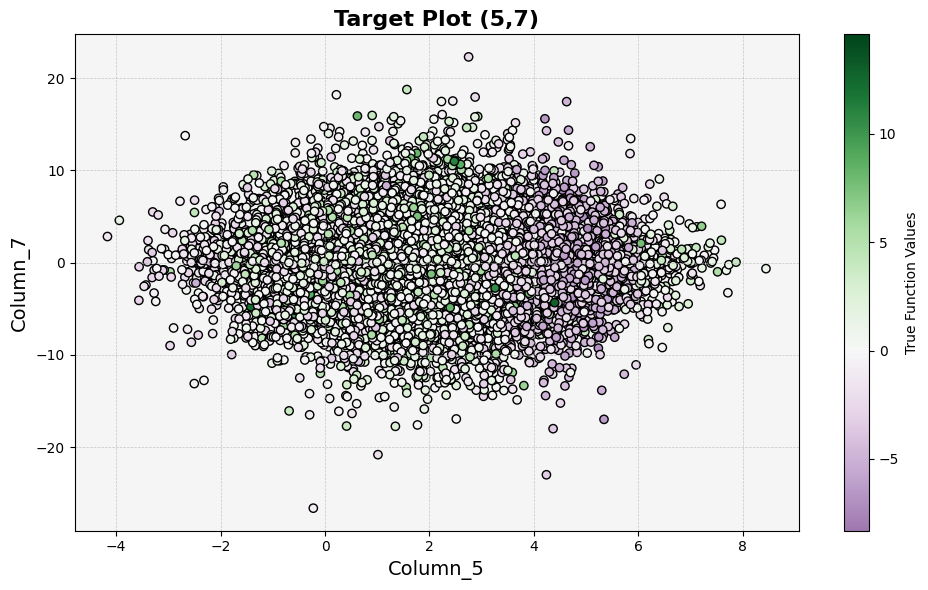

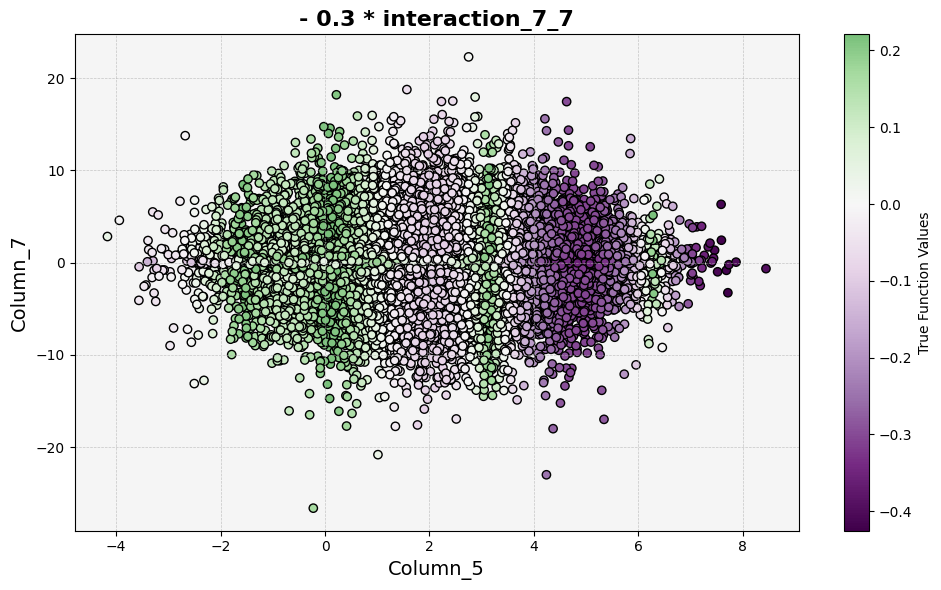

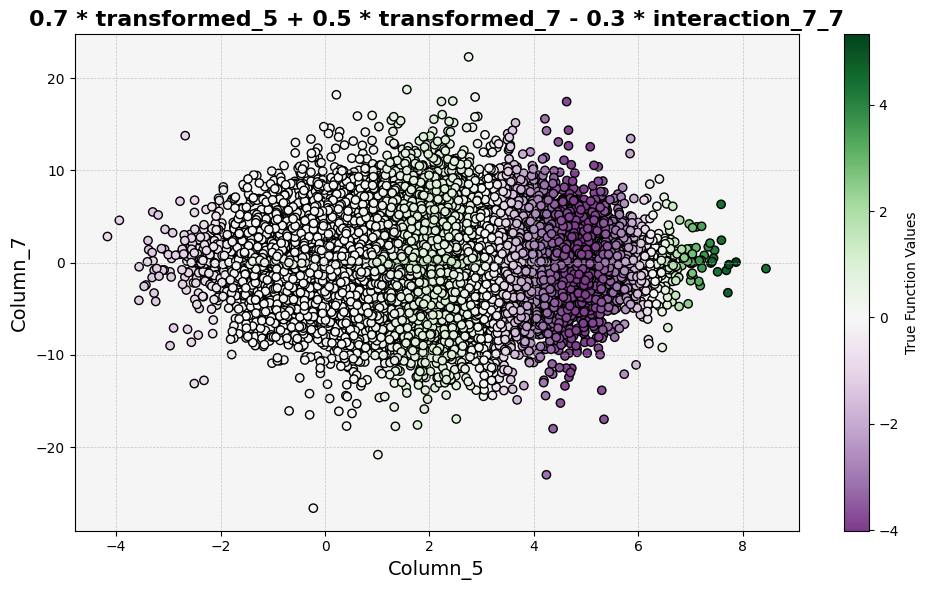

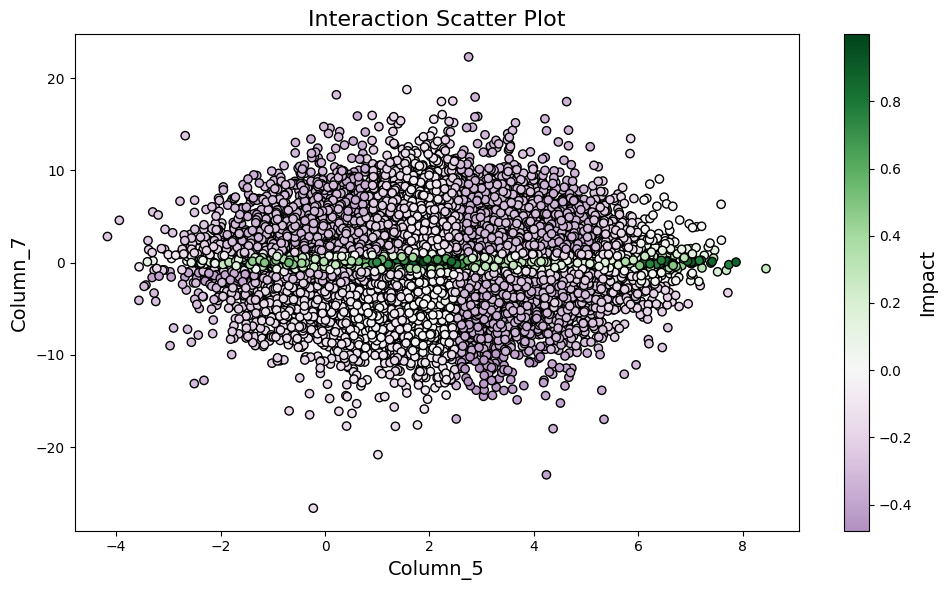

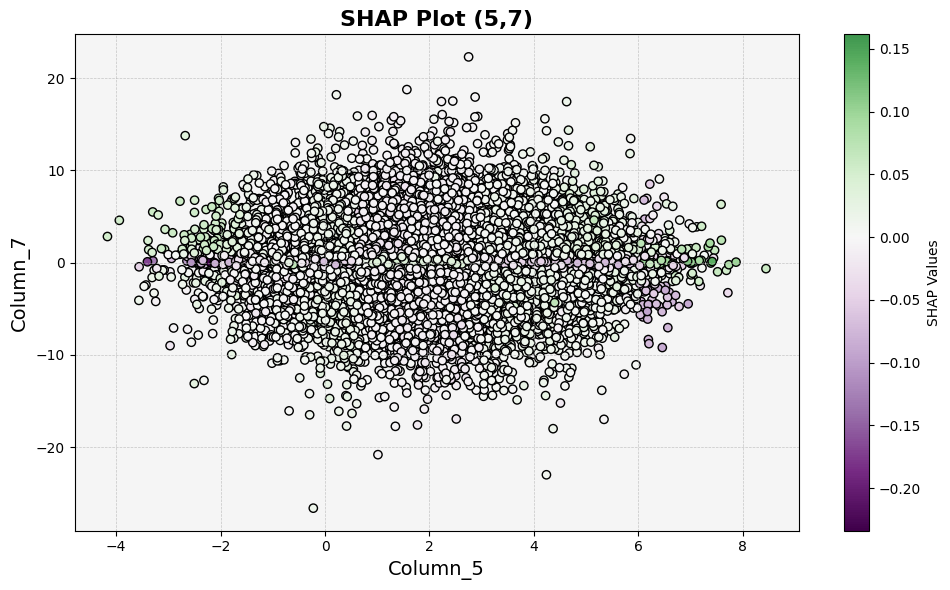

In [33]:
# Interaction Analysis: Feature 5 & Feature 7
df_67 = explainer.analyze_interaction(5, 7)

plot_scatter_chart(
    feature_5,
    feature_7,
    pred - np.mean(pred),
    x_label="Column_5",
    y_label="Column_7",
    title="Target Plot (5,7)",
    cbar_label="True Function Values",
)

plot_scatter_chart(
    feature_5,
    feature_7,
    - 0.3 * interaction_5_7 - np.mean(- 0.3 * interaction_5_7),
    x_label="Column_5",
    y_label="Column_7",
    title="- 0.3 * interaction_7_7",
    cbar_label="True Function Values",
)


plot_scatter_chart(
    feature_5,
    feature_7,
    0.7 * transformed_5 + 0.5 * transformed_7 - 0.3 * interaction_5_7 - np.mean(  0.7 * transformed_5 + 0.5 * transformed_7 - 0.3 * interaction_5_7),
    x_label="Column_5",
    y_label="Column_7",
    title="0.7 * transformed_5 + 0.5 * transformed_7 - 0.3 * interaction_7_7",
    cbar_label="True Function Values",
)

interaction_scatter_plot(X, df_67, 5, 7, figsize=(10, 6))

plot_scatter_chart(
    feature_5,
    feature_7,
    shap_interaction_values[:, 5, 7],
    x_label="Column_5",
    y_label="Column_7",
    title="SHAP Plot (5,7)",
    cbar_label="SHAP Values",
)

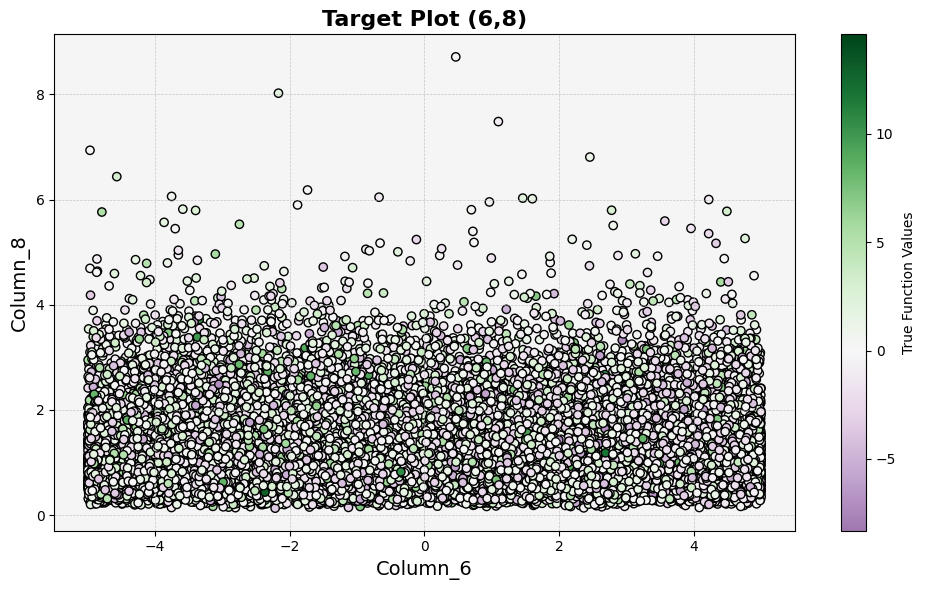

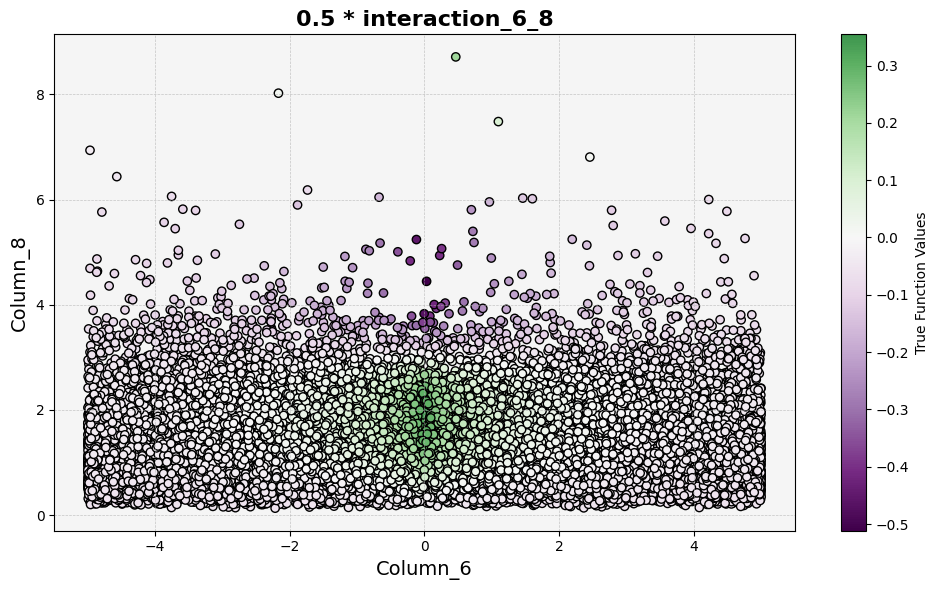

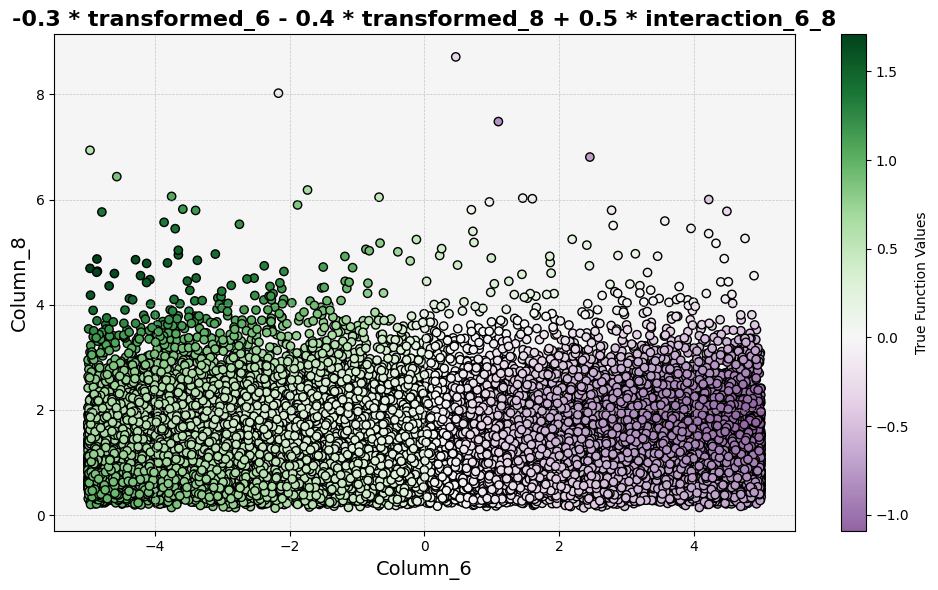

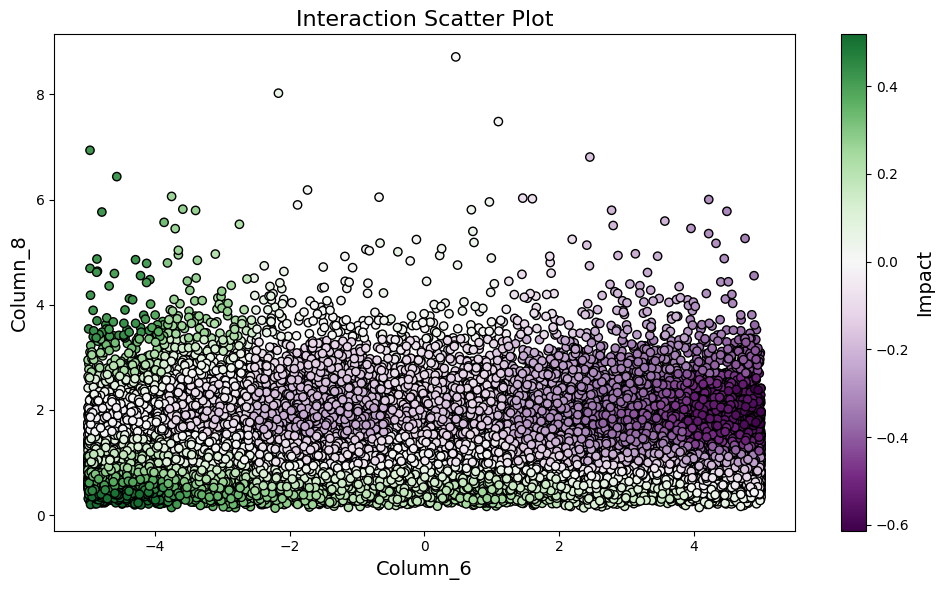

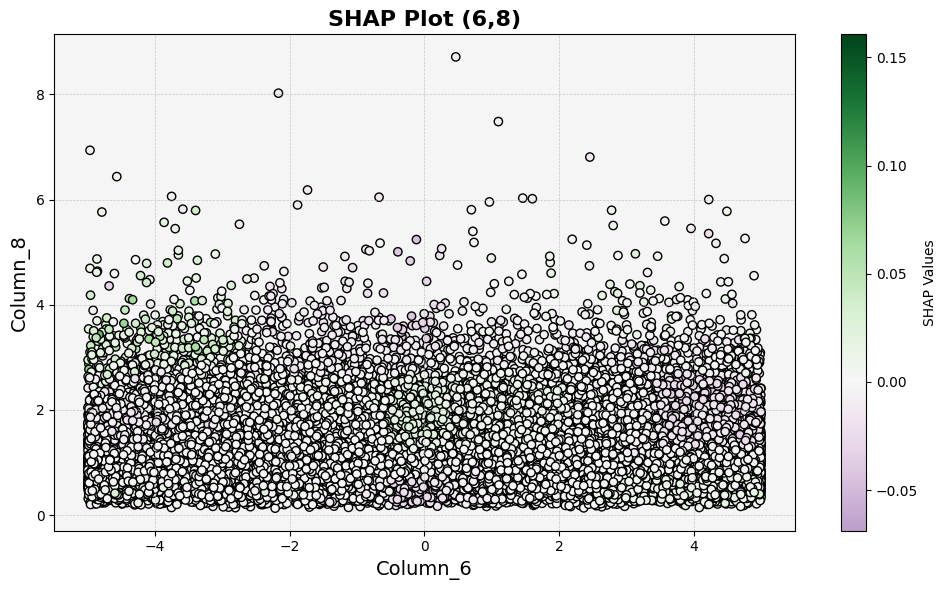

In [34]:
# Interaction Analysis: Feature 7 & Feature 8
df_78 = explainer.analyze_interaction(6, 8)

plot_scatter_chart(
    feature_6,
    feature_8,
    pred - np.mean(pred),
    x_label="Column_6",
    y_label="Column_8",
    title="Target Plot (6,8)",
    cbar_label="True Function Values",
)

plot_scatter_chart(
    feature_6,
    feature_8,
    0.5 * interaction_6_8 - np.mean(0.5 * interaction_6_8),
    x_label="Column_6",
    y_label="Column_8",
    title="0.5 * interaction_6_8",
    cbar_label="True Function Values",
)

plot_scatter_chart(
    feature_6,
    feature_8,
    -0.3 * transformed_6 - 0.4 * transformed_8 + 0.5 * interaction_6_8 - np.mean(-0.3 * transformed_6 - 0.4 * transformed_8 + 0.5 * interaction_6_8),
    x_label="Column_6",
    y_label="Column_8",
    title="-0.3 * transformed_6 - 0.4 * transformed_8 + 0.5 * interaction_6_8",
    cbar_label="True Function Values",
)

interaction_scatter_plot(X, df_78, 6, 8, figsize=(10, 6))

plot_scatter_chart(
    feature_6,
    feature_8,
    shap_interaction_values[:, 6, 8],
    x_label="Column_6",
    y_label="Column_8",
    title="SHAP Plot (6,8)",
    cbar_label="SHAP Values",
)